In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os 
import sys
import glob
import torch
import pickle as pkl
from os.path import join
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sys
from sklearn.metrics.pairwise import cosine_similarity
from scipy.stats import ttest_1samp
sys.path.append("/n/home12/binxuwang/Github/Neuro-ActMax-GAN-comparison")

### Load meta & neural data of all windows

In [3]:
tabdir = r"/n/holylabs/LABS/kempner_fellows/Users/binxuwang/Projects/BigGAN_Project/Stats_tables"
meta_df = pd.read_csv(join(tabdir, "meta_activation_stats_w_optimizer.csv"), index_col=0)

In [4]:
from neuro_data_analysis.neural_data_lib import load_neural_data, \
        load_img_resp_pairs_multiwindow, load_resp_multiwindow
from neuro_data_analysis.neural_data_utils import get_all_masks
stim_rootdir = "/n/holylabs/LABS/kempner_fellows/Users/binxuwang/Datasets"

BFEStats_merge, BFEStats = load_neural_data()

### Path for image embeddings (GAN & Evol)

In [5]:
GANembed_root = "/n/holylabs/LABS/kempner_fellows/Users/binxuwang/Projects/GAN_img_embedding"
GANembed_dir = join(GANembed_root, "dinov2_vitb14")
Evol_embed_root = '/n/holylabs/LABS/kempner_fellows/Users/binxuwang/Projects/BigGAN_img_embedding'
Evol_embed_dir = join(Evol_embed_root, "dinov2_vitb14")

def load_compute_eigen(dataset_str):
    if dataset_str == "imagenet_valid":
        embed = pkl.load(open(join(GANembed_dir, dataset_str+"_embedding.pkl"), "rb"))
    else:
        _, embed = pkl.load(open(join(GANembed_dir, dataset_str+"_embedding.pkl"), "rb"))
    embed = embed.cuda()
    cov = torch.cov(embed.T, )
    data_mean = embed.mean(dim=0)
    data_eigvals, data_eigvecs = torch.linalg.eigh(cov)
    data_eigvals = torch.flip(data_eigvals, dims=[0])
    data_eigvecs = torch.flip(data_eigvecs, dims=[1])
    return (data_mean, data_eigvals, data_eigvecs)


# compute mahalanobis distance
def mahalanobis_sqdist(x, mean, eigvec, eigval, eigfloor=1e-5, device="cuda"):
    x = x.to(device) - mean[None, :].to(device)
    # rotate
    rot_x = x @ eigvec
    # scale
    return (rot_x ** 2 / torch.clamp(eigval[None, :].to(device), min=eigfloor)).sum(dim=1)


# plot functions to collect activation / distace according to gens. 
def compute_mean_var(x, gen_vec, var="std"):
    meanvec = []
    errvec = []
    for gen in range(gen_vec.min(), gen_vec.max()+1):
        meanvec.append(x[gen_vec==gen].mean())
        if var == "std":
            errvec.append(x[gen_vec==gen].std())
        elif var == "var":
            errvec.append(x[gen_vec==gen].var())
        elif var == "sem":
            errvec.append(x[gen_vec==gen].std() / np.sqrt((gen_vec==gen).sum()))
    return torch.tensor(meanvec), torch.tensor(errvec)


def plot_shaded_errorbar(x, y, color="b", label="", var="std", **kwargs):
    meanvec, errvec = compute_mean_var(y, x, var=var)
    plt.plot(np.unique(x), meanvec, color=color, label=label, **kwargs)
    plt.fill_between(np.unique(x), meanvec-errvec, meanvec+errvec, color=color, alpha=0.3)

### Compute Eigen / PC basis of image embedding in datasets

In [6]:
MH_eig_col = {}
for dataset_str in [
    "DeePSim_4std",
    "BigGAN_trunc07",
    "BigGAN_std_008",
    "imagenet_valid",
    'ecoset_val',
    'places365_val',
    'massmem_objects',
    'curvature_contour',
    "pink_noise",
]:
    MH_eig_col[dataset_str] = load_compute_eigen(dataset_str)

### Concat all regression results into master tensors
For each dataset for computing PC, we iterate through all experiment sessions and concat the statistical results into a master tensor for further analysis. 

So we will have one npz file for each dataset in the `savedir`

Specifically we store, 
* Cosine similarity of weights between time bins. 
    * DP-DP, DP-BG, BG-BG. 
* Cross evaluation of model prediction R2 between two datasets. 
    * DP-> BG ; BG->DP

In [82]:
from collections import defaultdict
from tqdm import trange, tqdm
savedir = r"/n/holylabs/LABS/kempner_fellows/Users/binxuwang/Projects/BigGAN_Project/EvolLinReg_axes"
rsp_wdw_fine = [range(50, 200), range(0, 50), range(50, 100), range(100, 150), range(150, 200)]
rsp_wdw_fine += [range(strt, strt+25) for strt in range(0, 200, 25)] 

for dataset_str in [
            "imagenet_valid",
            'ecoset_val',
            'places365_val',
            'massmem_objects',
            "DeePSim_4std",
            "BigGAN_trunc07",
            "BigGAN_std_008",
            'curvature_contour',
            "pink_noise",
        ]:
    print(f"Collecting stats for {dataset_str}")
    stats_col = defaultdict(dict)
    for Expi in trange(1, 1 + 190):
        if Expi not in meta_df.index: 
            continue
        model_stats_synopsis = pkl.load(open(join(savedir, f"Exp{Expi:03d}_{dataset_str}_PC_model_stats.pkl"), "rb"))
        cross_eval_synopsis = pkl.load(open(join(savedir, f"Exp{Expi:03d}_{dataset_str}_PC_cross_eval_stats.pkl"), "rb"))
        for PCcutoff in model_stats_synopsis:
            model0 = model_stats_synopsis[PCcutoff]["thread 0"][0]
            model1 = model_stats_synopsis[PCcutoff]["thread 1"][0]
            modelcmb = model_stats_synopsis[PCcutoff]["combined"][0]
            cossim00 = cosine_similarity(model0.coef_, model0.coef_)
            cossim11 = cosine_similarity(model1.coef_, model1.coef_)
            cossim01 = cosine_similarity(model0.coef_, model1.coef_)
            cossim02 = cosine_similarity(model0.coef_, modelcmb.coef_)
            cossim12 = cosine_similarity(model1.coef_, modelcmb.coef_)
            cossim22 = cosine_similarity(modelcmb.coef_, modelcmb.coef_)
            # set diagonal to nan
            cossim00 = cossim00 + np.diag(np.ones(cossim00.shape[0])*np.nan)
            cossim11 = cossim11 + np.diag(np.ones(cossim11.shape[0])*np.nan)
            cossim22 = cossim22 + np.diag(np.ones(cossim22.shape[0])*np.nan)
            # cross_eval_mat is 3 x 3 matrix, 1st index is eval on , 2nd index is train on 
            # NOTE The transpose! 
            cross_eval_mat = np.array([[cross_eval_synopsis[PCcutoff][(a, b)][1] 
                                    for a in ["thread 0", "thread 1", "combined"]] 
                                    for b in ["thread 0", "thread 1", "combined"]])
            # cross_eval_eachtime_tsr is 3 x 3 x len(rsp_wdw_fine) matrix, 
            # each element is the cross eval R2 score for a time window
            cross_eval_eachtime_tsr = np.array([[cross_eval_synopsis[PCcutoff][(a, b)][0] 
                                    for a in ["thread 0", "thread 1", "combined"]] 
                                    for b in ["thread 0", "thread 1", "combined"]])
            stats_col[Expi][PCcutoff] = {
                "cossim00": cossim00,
                "cossim11": cossim11,
                "cossim01": cossim01,
                "cossim02": cossim02,
                "cossim12": cossim12,
                "cossim22": cossim22,
                "cross_eval_mat": cross_eval_mat,
                "cross_eval_eachtime_tsr": cross_eval_eachtime_tsr,
            }
    # reorganize the stats_col into a bigger tensor 
    stats_col_tsr = {}
    for k in ["cossim00", "cossim11", "cossim01", 
              "cossim02", "cossim12", "cossim22",
              "cross_eval_mat", "cross_eval_eachtime_tsr"]:
        stats_col_tsr[k] = np.array([[stats_col[Expi][PCcutoff][k] 
                                    for PCcutoff in stats_col[Expi]] 
                                    for Expi in stats_col ])
        print (stats_col_tsr[k].shape) # Exp x PCcutoff x 3 x 3 x len(rsp_wdw_fine)

    PCcutoff_list = list(cross_eval_synopsis.keys())
    # save master file 
    np.savez(join(savedir, "summary", f"Evol_regress_weights_dyna_synopsis_{dataset_str}_PC.npz"), **stats_col_tsr,
             PCcutoff_list=PCcutoff_list, rsp_wdw_fine=rsp_wdw_fine)


  0%|          | 0/190 [00:00<?, ?it/s]

100%|██████████| 190/190 [00:02<00:00, 71.74it/s]
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/numpy/lib/npyio.py:713: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  val = np.asanyarray(val)


(170, 9, 13, 13)
(170, 9, 13, 13)
(170, 9, 13, 13)
(170, 9, 13, 13)
(170, 9, 13, 13)
(170, 9, 13, 13)
(170, 9, 3, 3)
(170, 9, 3, 3, 13)


100%|██████████| 190/190 [00:02<00:00, 71.94it/s]
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/numpy/lib/npyio.py:713: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  val = np.asanyarray(val)


(170, 9, 13, 13)
(170, 9, 13, 13)
(170, 9, 13, 13)
(170, 9, 13, 13)
(170, 9, 13, 13)
(170, 9, 13, 13)
(170, 9, 3, 3)
(170, 9, 3, 3, 13)


100%|██████████| 190/190 [00:02<00:00, 71.94it/s]
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/numpy/lib/npyio.py:713: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  val = np.asanyarray(val)


(170, 9, 13, 13)
(170, 9, 13, 13)
(170, 9, 13, 13)
(170, 9, 13, 13)
(170, 9, 13, 13)
(170, 9, 13, 13)
(170, 9, 3, 3)
(170, 9, 3, 3, 13)


100%|██████████| 190/190 [00:02<00:00, 72.05it/s]
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/numpy/lib/npyio.py:713: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  val = np.asanyarray(val)


(170, 9, 13, 13)
(170, 9, 13, 13)
(170, 9, 13, 13)
(170, 9, 13, 13)
(170, 9, 13, 13)
(170, 9, 13, 13)
(170, 9, 3, 3)
(170, 9, 3, 3, 13)


100%|██████████| 190/190 [00:02<00:00, 71.78it/s]
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/numpy/lib/npyio.py:713: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  val = np.asanyarray(val)


(170, 9, 13, 13)
(170, 9, 13, 13)
(170, 9, 13, 13)
(170, 9, 13, 13)
(170, 9, 13, 13)
(170, 9, 13, 13)
(170, 9, 3, 3)
(170, 9, 3, 3, 13)


100%|██████████| 190/190 [00:02<00:00, 70.54it/s]
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/numpy/lib/npyio.py:713: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  val = np.asanyarray(val)


(170, 9, 13, 13)
(170, 9, 13, 13)
(170, 9, 13, 13)
(170, 9, 13, 13)
(170, 9, 13, 13)
(170, 9, 13, 13)
(170, 9, 3, 3)
(170, 9, 3, 3, 13)


100%|██████████| 190/190 [00:02<00:00, 70.84it/s]
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/numpy/lib/npyio.py:713: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  val = np.asanyarray(val)


(170, 9, 13, 13)
(170, 9, 13, 13)
(170, 9, 13, 13)
(170, 9, 13, 13)
(170, 9, 13, 13)
(170, 9, 13, 13)
(170, 9, 3, 3)
(170, 9, 3, 3, 13)


100%|██████████| 190/190 [00:02<00:00, 70.62it/s]
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/numpy/lib/npyio.py:713: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  val = np.asanyarray(val)


(170, 9, 13, 13)
(170, 9, 13, 13)
(170, 9, 13, 13)
(170, 9, 13, 13)
(170, 9, 13, 13)
(170, 9, 13, 13)
(170, 9, 3, 3)
(170, 9, 3, 3, 13)


100%|██████████| 190/190 [00:02<00:00, 71.51it/s]

(170, 9, 13, 13)
(170, 9, 13, 13)
(170, 9, 13, 13)
(170, 9, 13, 13)
(170, 9, 13, 13)
(170, 9, 13, 13)
(170, 9, 3, 3)
(170, 9, 3, 3, 13)



/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/numpy/lib/npyio.py:713: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  val = np.asanyarray(val)


## Post hoc Synopsis

We are interested in the following aspects of results 

In [83]:
def plot_heatmap(data, xticklabels, yticklabels, label_xys, title, syncvlim=True):
    if syncvlim:
        vmin = np.min([np.nanmin(d) for d in data])
        vmax = np.max([np.nanmax(d) for d in data])
    else: 
        vmin, vmax = None, None
    figh, axs = plt.subplots(1, 3, figsize=[17, 5], squeeze=False)
    for i, ax in enumerate(axs.flatten()):
        xlabel, ylabel = label_xys[i]
        sns.heatmap(data[i], annot=True, cmap="jet", fmt=".2f",
                    xticklabels=xticklabels, yticklabels=yticklabels, ax=ax,
                    vmax=vmax, vmin=vmin)
        ax.set_xlabel(xlabel)
        ax.set_ylabel(ylabel)
        ax.set_title(title[i])
        ax.axis("image")
    return figh, axs

### Set up savedir, response window and session masks

In [84]:
from collections import defaultdict
from tqdm import trange, tqdm
savedir = r"/n/holylabs/LABS/kempner_fellows/Users/binxuwang/Projects/BigGAN_Project/EvolLinReg_axes"

In [23]:
dataset_str = "imagenet_valid"
with np.load(join(savedir, "summary", f"Evol_regress_weights_dyna_synopsis_{dataset_str}_PC.npz"), allow_pickle=True) as data:
    PCcutoff_list = data["PCcutoff_list"]
    rsp_wdw_fine = list(data["rsp_wdw_fine"])

In [36]:
timewdw_strs = [f"{wdw[0]},{wdw[-1]+1}" for wdw in rsp_wdw_fine]

In [11]:
# rsp_wdws = [range(50, 200), range(0, 50), range(50, 100), range(100, 150), range(150, 200)]
# rsp_wdw_fine = [range(50, 200), range(0, 50), range(50, 100), range(100, 150), range(150, 200)]
# rsp_wdw_fine += [range(strt, strt+25) for strt in range(0, 200, 25)]

In [24]:
Amsk, Bmsk, V1msk, V4msk, ITmsk, \
    length_msk, spc_msk, sucsmsk, bsl_unstable_msk, \
    bsl_stable_msk, validmsk = get_all_masks(meta_df, return_type=tuple)
FCsucs_msk = meta_df.p_maxinit_0 < 0.05 
BGsucs_msk = meta_df.p_maxinit_1 < 0.05
bothsucs_msk = FCsucs_msk & BGsucs_msk
anysucs_msk = FCsucs_msk | BGsucs_msk

total number of experiments: 170
total number of valid experiments: 154
total number of valid experiments with suc: 133
Exluded:
  - short: 8
  - unstable baseline: 6
  - not fc6-BigGAN: 3


### Single session loading and visualization

In [ ]:
Expi = 155
savedir = r"/n/holylabs/LABS/kempner_fellows/Users/binxuwang/Projects/BigGAN_Project/EvolLinReg_axes"

model_stats_synopsis = pkl.load(open(join(savedir, f"Exp{Expi:03d}_imagenet_valid_PC_model_stats.pkl"), "rb"))
cross_eval_synopsis = pkl.load(open(join(savedir, f"Exp{Expi:03d}_imagenet_valid_PC_cross_eval_stats.pkl"), "rb"))

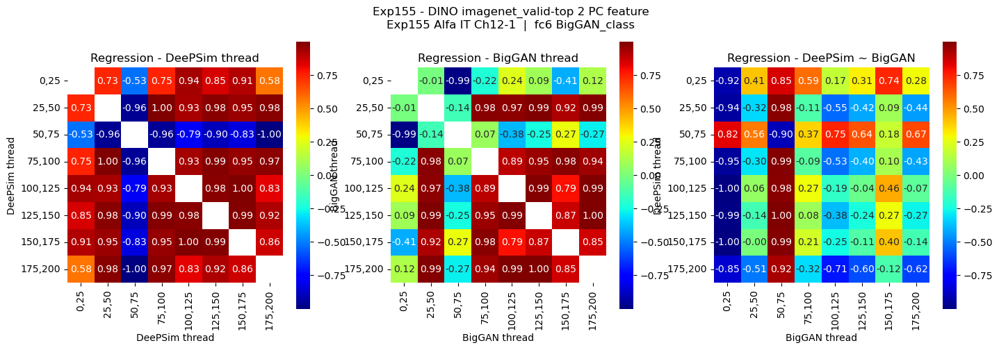

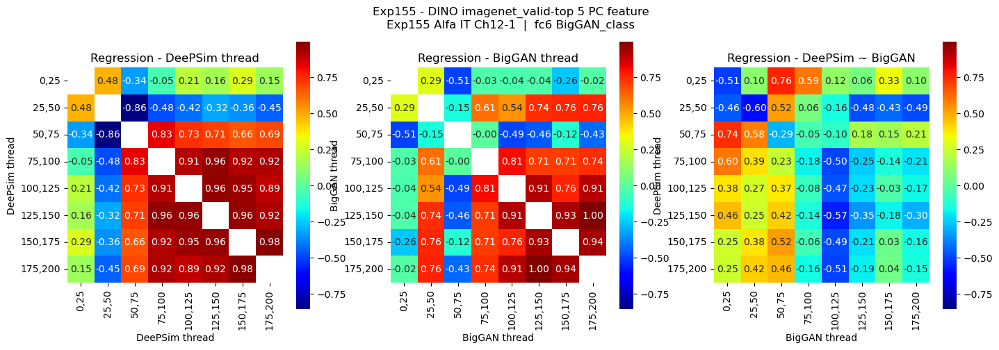

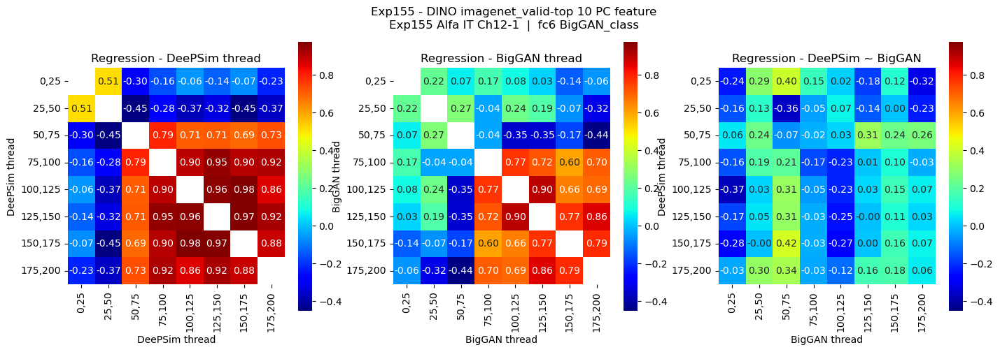

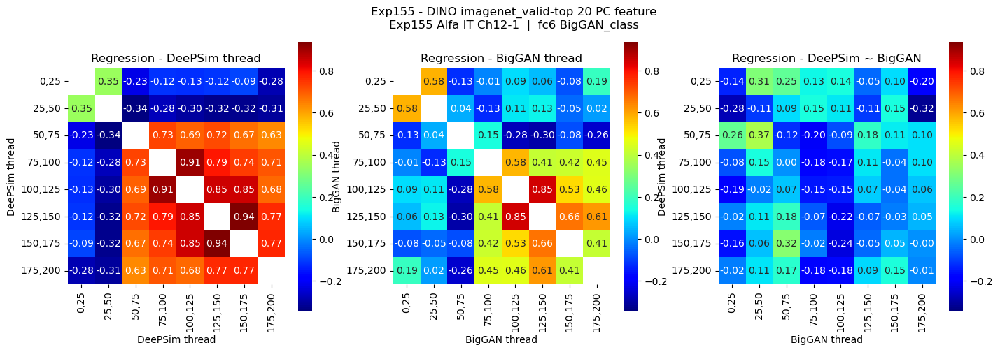

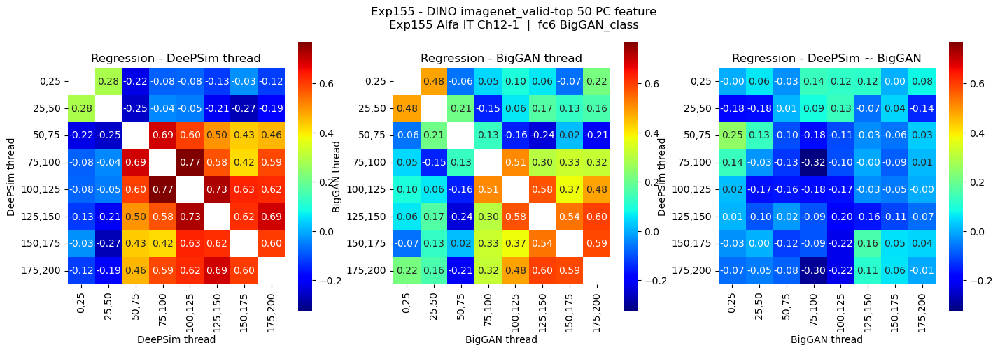

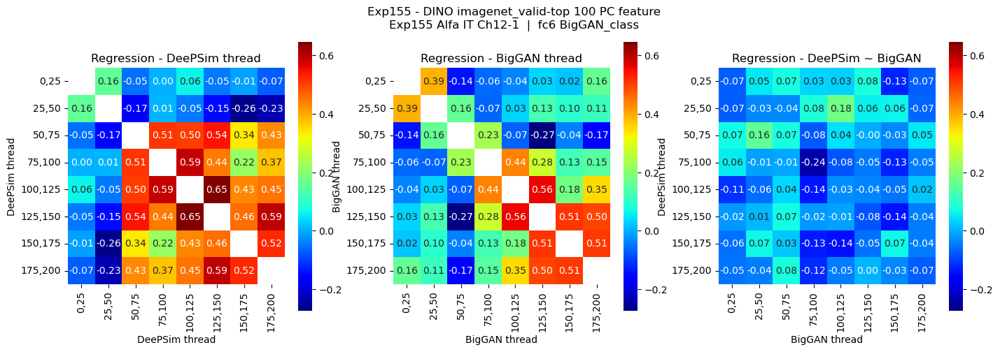

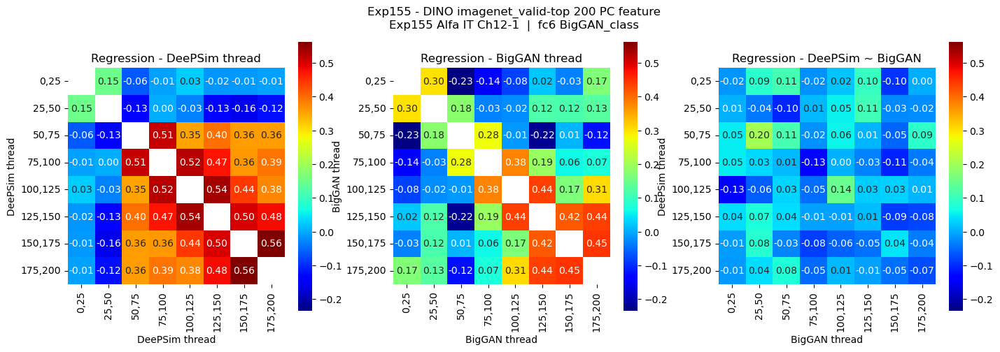

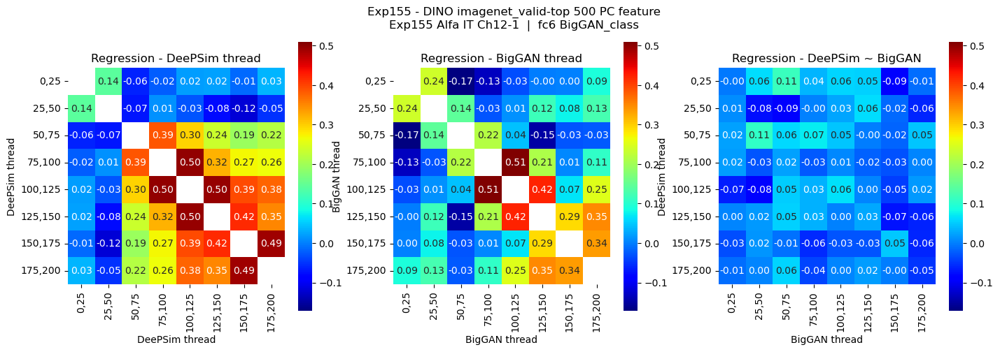

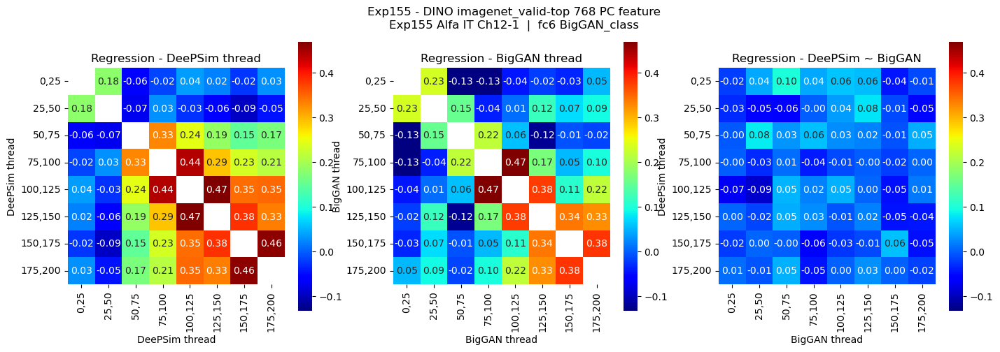

In [ ]:
Expi = 155
savedir = r"/n/holylabs/LABS/kempner_fellows/Users/binxuwang/Projects/BigGAN_Project/EvolLinReg_axes"

model_stats_synopsis = pkl.load(open(join(savedir, f"Exp{Expi:03d}_imagenet_valid_PC_model_stats.pkl"), "rb"))
cross_eval_synopsis = pkl.load(open(join(savedir, f"Exp{Expi:03d}_imagenet_valid_PC_cross_eval_stats.pkl"), "rb"))

metaS = meta_df.loc[Expi]
expstr = f"Exp{Expi:03d} {metaS['Animal']} {metaS['visual_area']} Ch{metaS['prefchan']}-{metaS['prefunit']}"\
            f"  |  {metaS['space_names1']} {metaS['space_names2']}" 

for PCcutoff in model_stats_synopsis:
    model0 = model_stats_synopsis[PCcutoff]["thread 0"][0]
    model1 = model_stats_synopsis[PCcutoff]["thread 1"][0]
    cossim00 = cosine_similarity(model0.coef_, model0.coef_)
    cossim11 = cosine_similarity(model1.coef_, model1.coef_)
    cossim01 = cosine_similarity(model0.coef_, model1.coef_)
    # set diagonal to nan
    cossim00 = cossim00 + np.diag(np.ones(cossim00.shape[0])*np.nan)
    cossim11 = cossim11 + np.diag(np.ones(cossim11.shape[0])*np.nan) 
    for slc in [slice(-8, None)]: #slice(1, 5), 
        data = [cossim00[slc, slc], cossim11[slc, slc], cossim01[slc, slc]]
        xticklabels = [f"{wdw[0]},{wdw[-1]+1}" for wdw in rsp_wdw_fine[slc]]
        yticklabels = [f"{wdw[0]},{wdw[-1]+1}" for wdw in rsp_wdw_fine[slc]]
        label_xys = [("DeePSim thread", "DeePSim thread"), 
                    ("BigGAN thread", "BigGAN thread"),
                    ("BigGAN thread", "DeePSim thread")]
        title = ["Regression - DeePSim thread", "Regression - BigGAN thread", "Regression - DeePSim ~ BigGAN"]
        figh, axs = plot_heatmap(data, xticklabels, yticklabels, label_xys, title)
        figh.suptitle(f"Exp{Expi:03d} - {'DINO'} {dataset_str}-top {PCcutoff} PC feature\n{expstr}")
        figh.show()

/tmp/ipykernel_617568/1793250017.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  figh, axs = plt.subplots(1, 3, figsize=[17, 5], squeeze=False)


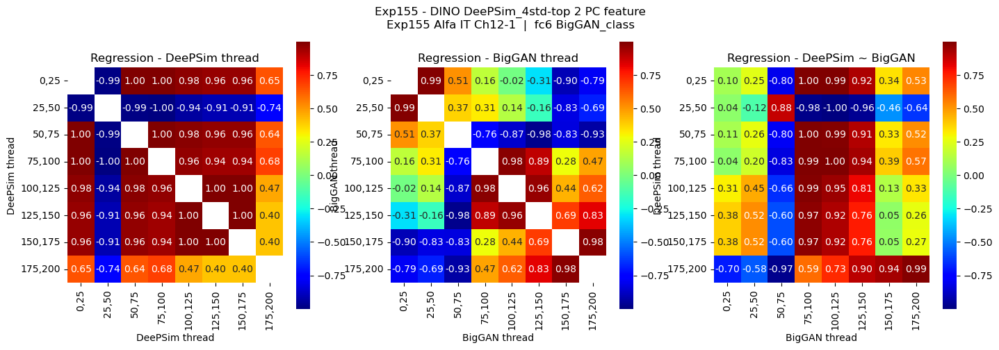

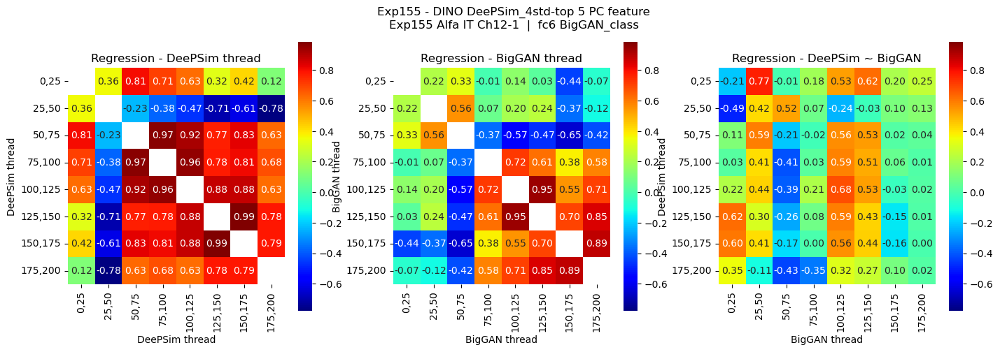

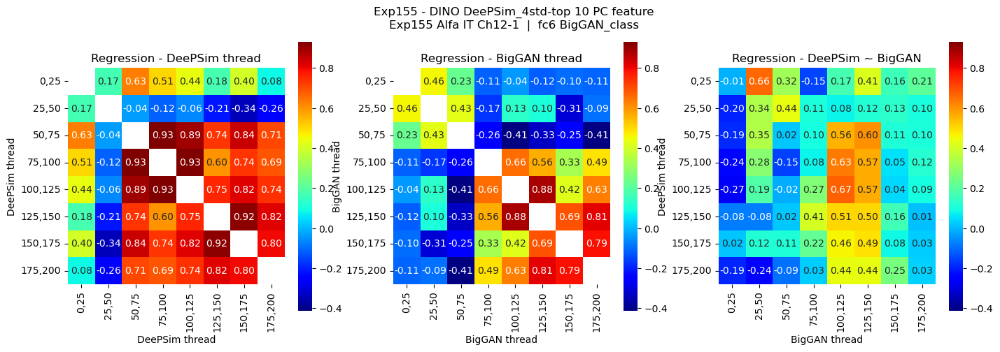

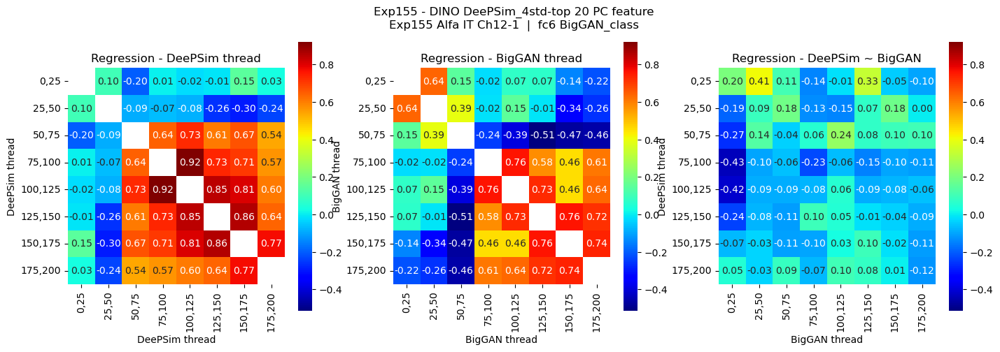

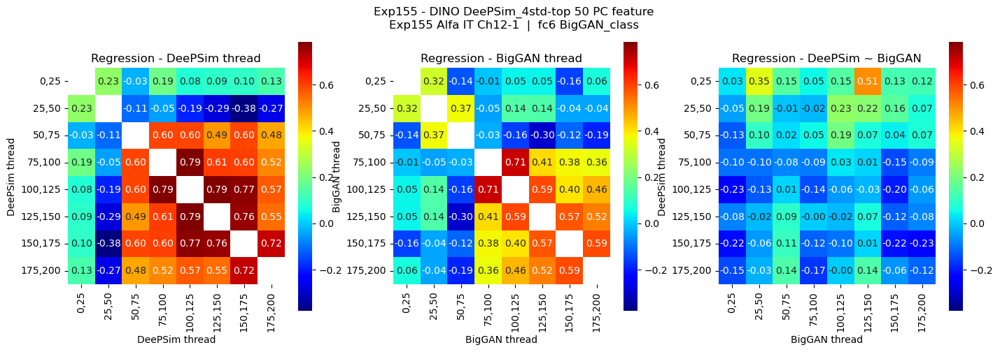

...

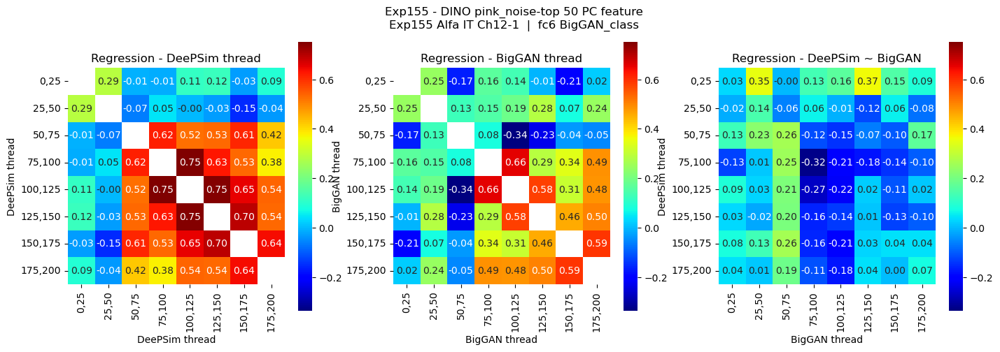

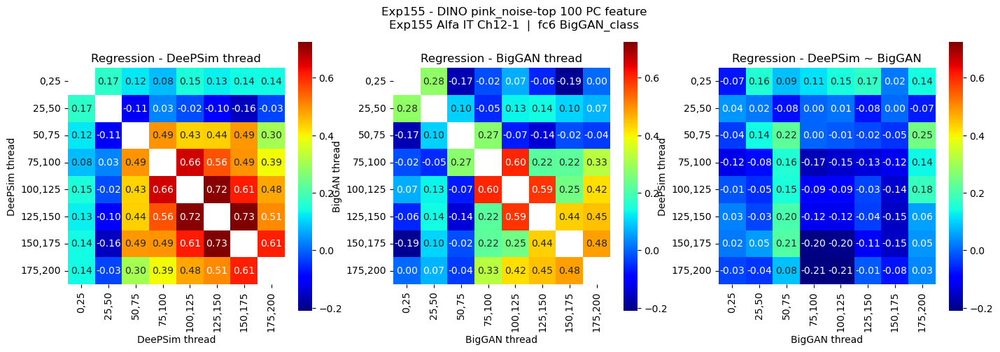

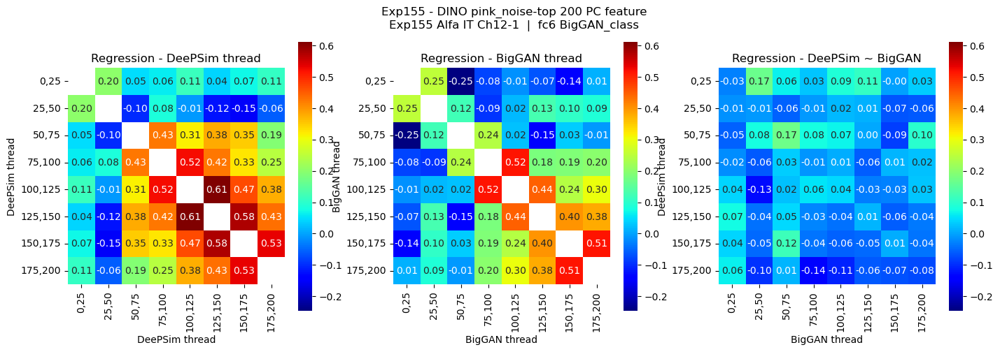

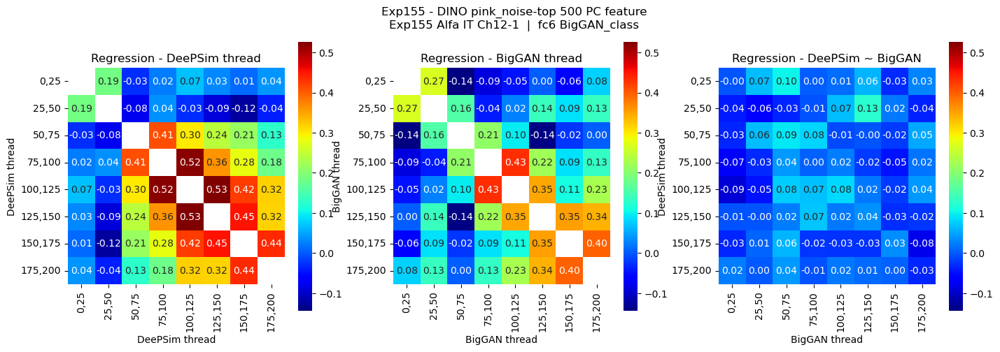

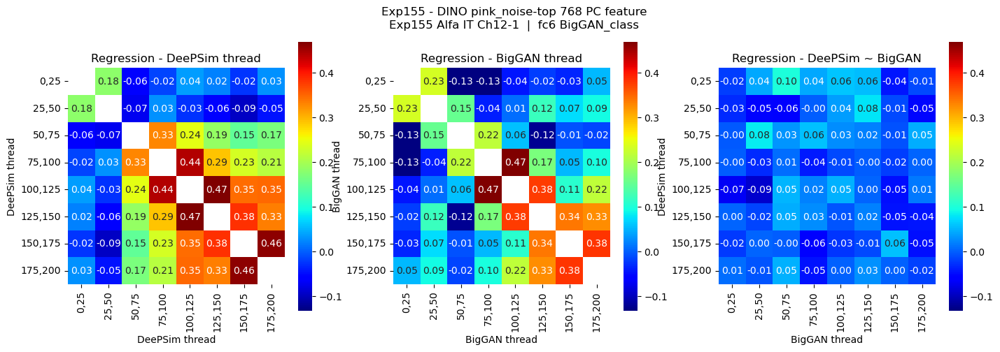

In [ ]:
Expi = 155
savedir = r"/n/holylabs/LABS/kempner_fellows/Users/binxuwang/Projects/BigGAN_Project/EvolLinReg_axes"
metaS = meta_df.loc[Expi]
expstr = f"Exp{Expi:03d} {metaS['Animal']} {metaS['visual_area']} Ch{metaS['prefchan']}-{metaS['prefunit']}"\
            f"  |  {metaS['space_names1']} {metaS['space_names2']}" 
            
for dataset_str in ["DeePSim_4std", "BigGAN_trunc07", "imagenet_valid", "pink_noise"]:
    model_stats_synopsis = pkl.load(open(join(savedir, f"Exp{Expi:03d}_{dataset_str}_PC_model_stats.pkl"), "rb"))
    cross_eval_synopsis = pkl.load(open(join(savedir, f"Exp{Expi:03d}_{dataset_str}_PC_cross_eval_stats.pkl"), "rb"))
    for PCcutoff in model_stats_synopsis:
        model0 = model_stats_synopsis[PCcutoff]["thread 0"][0]
        model1 = model_stats_synopsis[PCcutoff]["thread 1"][0]
        cossim00 = cosine_similarity(model0.coef_, model0.coef_)
        cossim11 = cosine_similarity(model1.coef_, model1.coef_)
        cossim01 = cosine_similarity(model0.coef_, model1.coef_)
        # set diagonal to nan
        cossim00 = cossim00 + np.diag(np.ones(cossim00.shape[0])*np.nan)
        cossim11 = cossim11 + np.diag(np.ones(cossim11.shape[0])*np.nan) 
        for slc in [slice(-8, None)]: #slice(1, 5), 
            data = [cossim00[slc, slc], cossim11[slc, slc], cossim01[slc, slc]]
            xticklabels = [f"{wdw[0]},{wdw[-1]+1}" for wdw in rsp_wdw_fine[slc]]
            yticklabels = [f"{wdw[0]},{wdw[-1]+1}" for wdw in rsp_wdw_fine[slc]]
            label_xys = [("DeePSim thread", "DeePSim thread"), 
                        ("BigGAN thread", "BigGAN thread"),
                        ("BigGAN thread", "DeePSim thread")]
            title = ["Regression - DeePSim thread", "Regression - BigGAN thread", "Regression - DeePSim ~ BigGAN"]
            figh, axs = plot_heatmap(data, xticklabels, yticklabels, label_xys, title)
            figh.suptitle(f"Exp{Expi:03d} - {'DINO'} {dataset_str}-top {PCcutoff} PC feature\n{expstr}")
            figh.show()

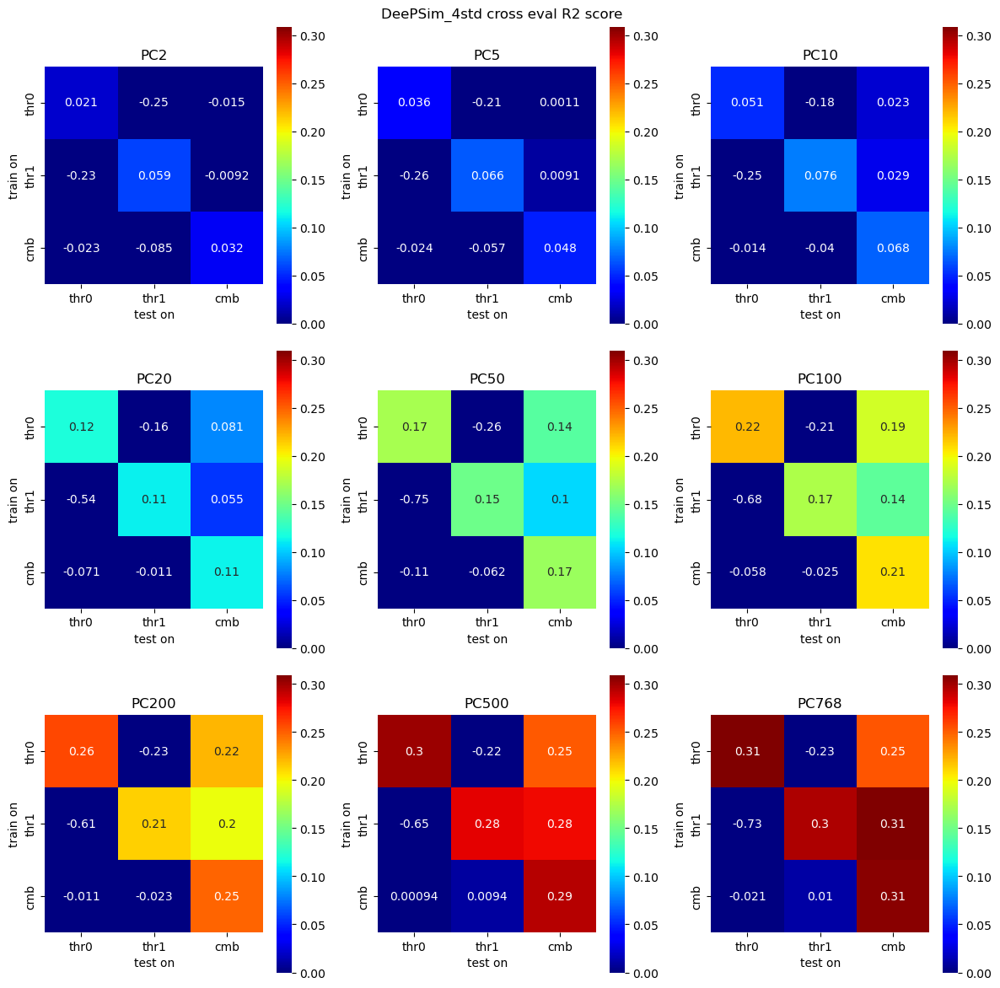

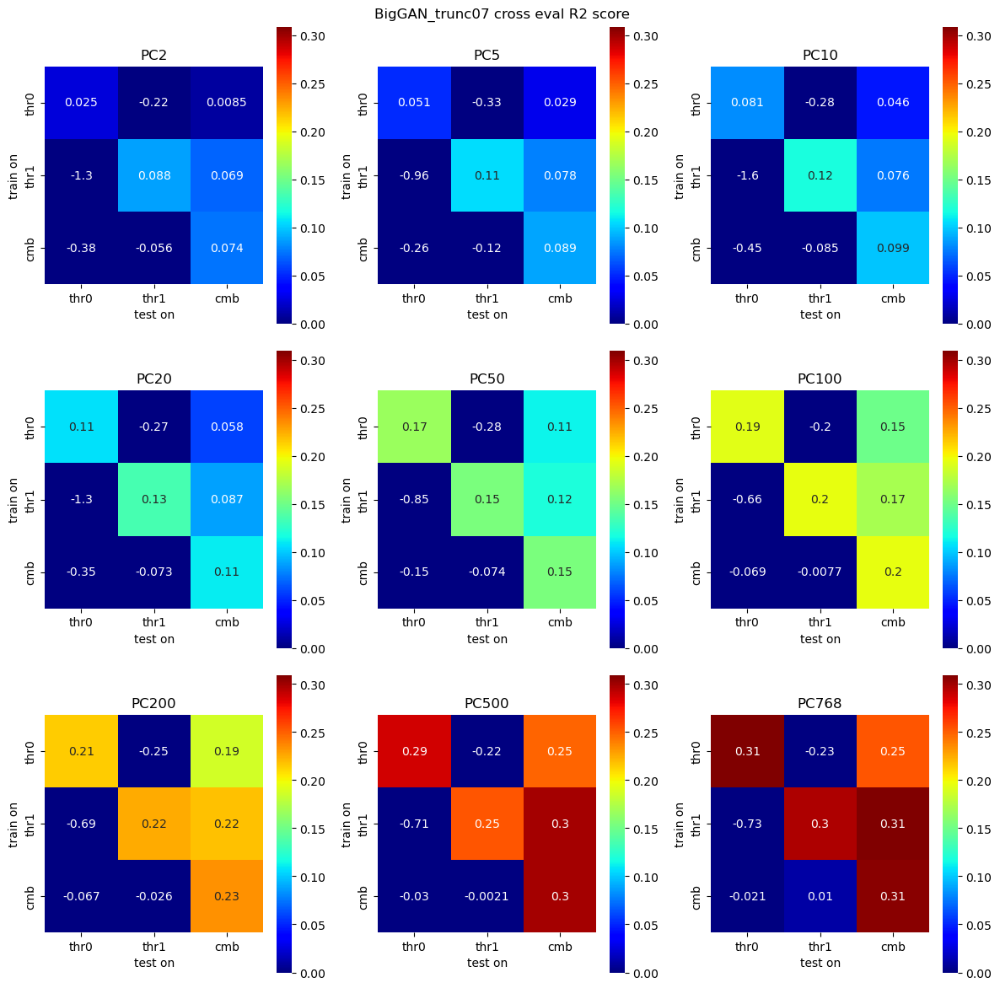

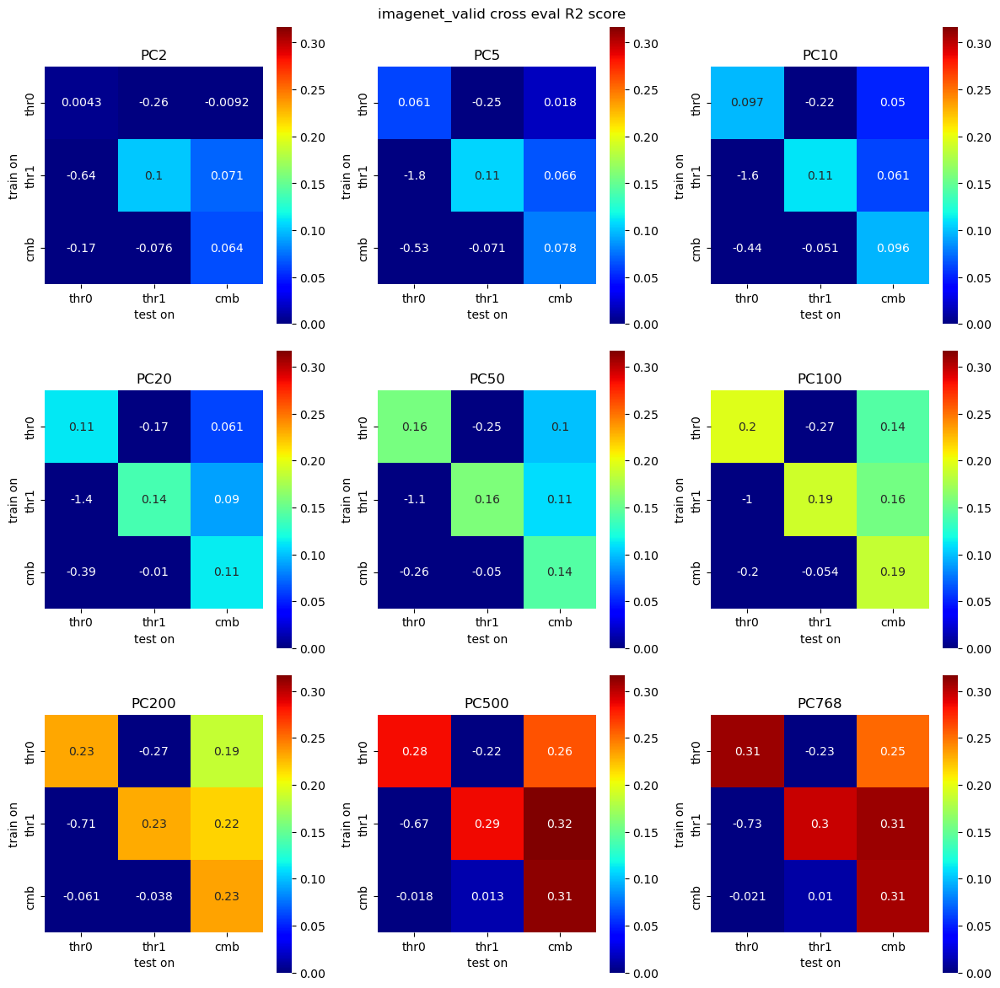

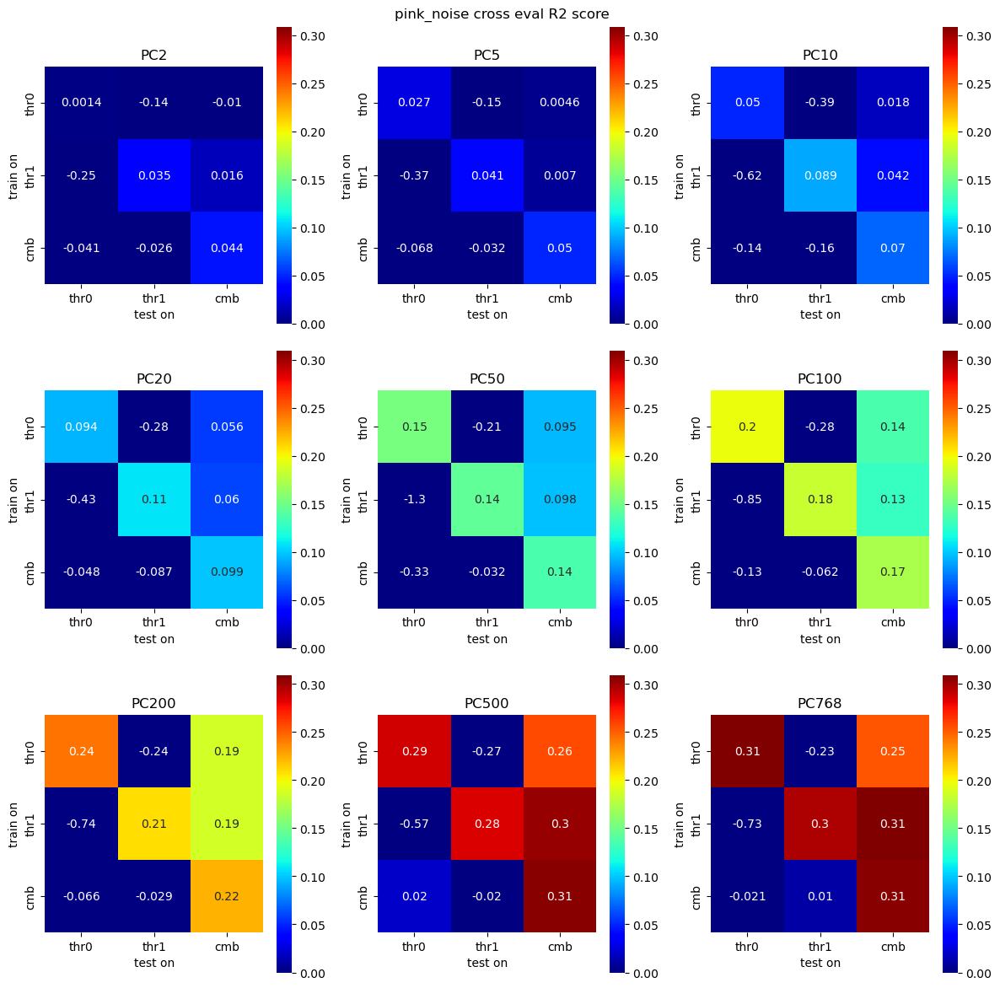

In [ ]:
for dataset_str in ["DeePSim_4std", "BigGAN_trunc07", "imagenet_valid", "pink_noise"]:
    model_stats_synopsis = pkl.load(open(join(savedir, f"Exp{Expi:03d}_{dataset_str}_PC_model_stats.pkl"), "rb"))
    cross_eval_synopsis = pkl.load(open(join(savedir, f"Exp{Expi:03d}_{dataset_str}_PC_cross_eval_stats.pkl"), "rb"))

    cross_eval_mat_col = []
    for i, PCcutoff in enumerate(cross_eval_synopsis):
        cross_eval_mat = np.array([[cross_eval_synopsis[PCcutoff][(a,b)][1] 
                                for a in ["thread 0", "thread 1", "combined"]] 
                                for b in ["thread 0", "thread 1", "combined"]])
        cross_eval_mat_col.append(cross_eval_mat)

    plt.figure(figsize=[12, 12])
    vmax = np.max([np.nanmax(d) for d in cross_eval_mat_col])
    for i, PCcutoff in enumerate(cross_eval_synopsis):
        cross_eval_mat = cross_eval_mat_col[i]
        plt.subplot(3, 3, i+1)
        sns.heatmap(cross_eval_mat, annot=True, cmap="jet", vmin=0.0, vmax=vmax, square=True, 
                    xticklabels=["thr0", "thr1", "cmb"],
                    yticklabels=["thr0", "thr1", "cmb"])
        plt.title(f"PC{PCcutoff}")
        plt.ylabel("train on")
        plt.xlabel("test on")
    plt.suptitle(f"{dataset_str} cross eval R2 score")
    plt.tight_layout()
    plt.show()

### Encoding / prediction accuracy vs PC dimension & PC cutoff number
depending on num of PC in regression

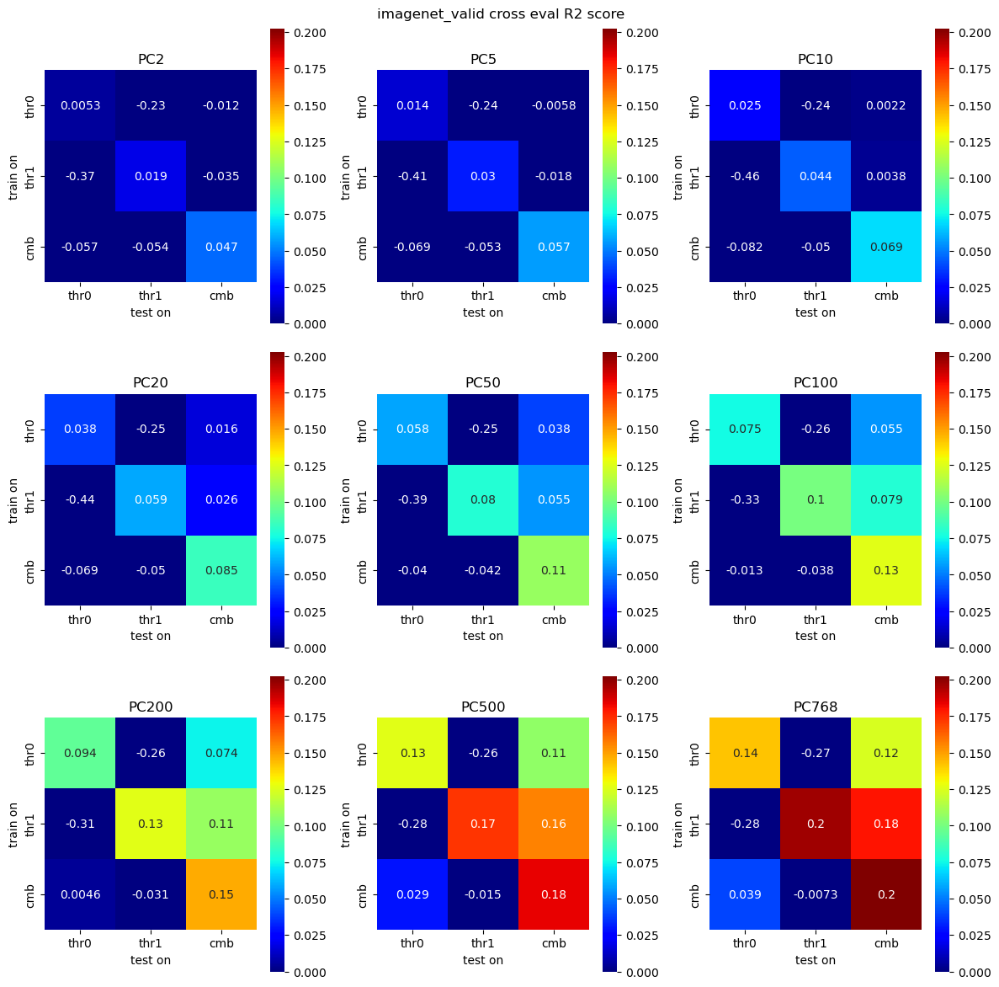

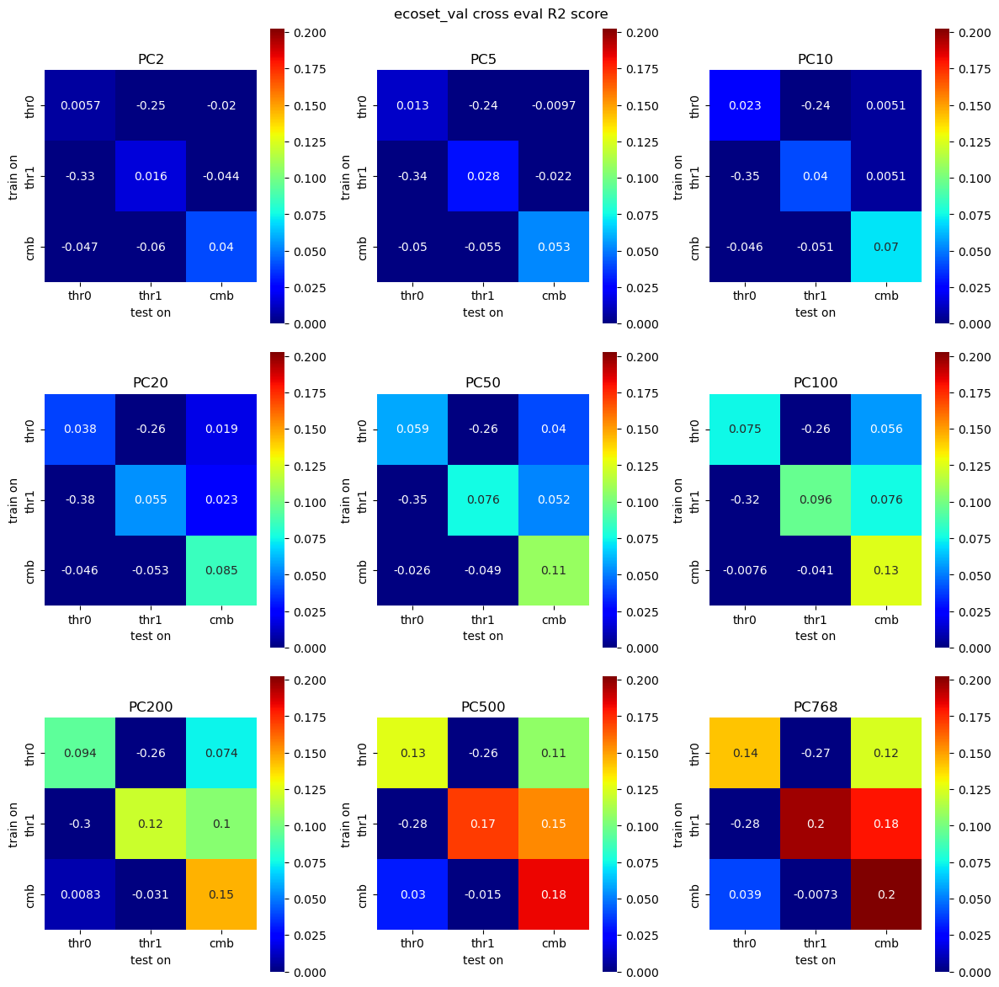

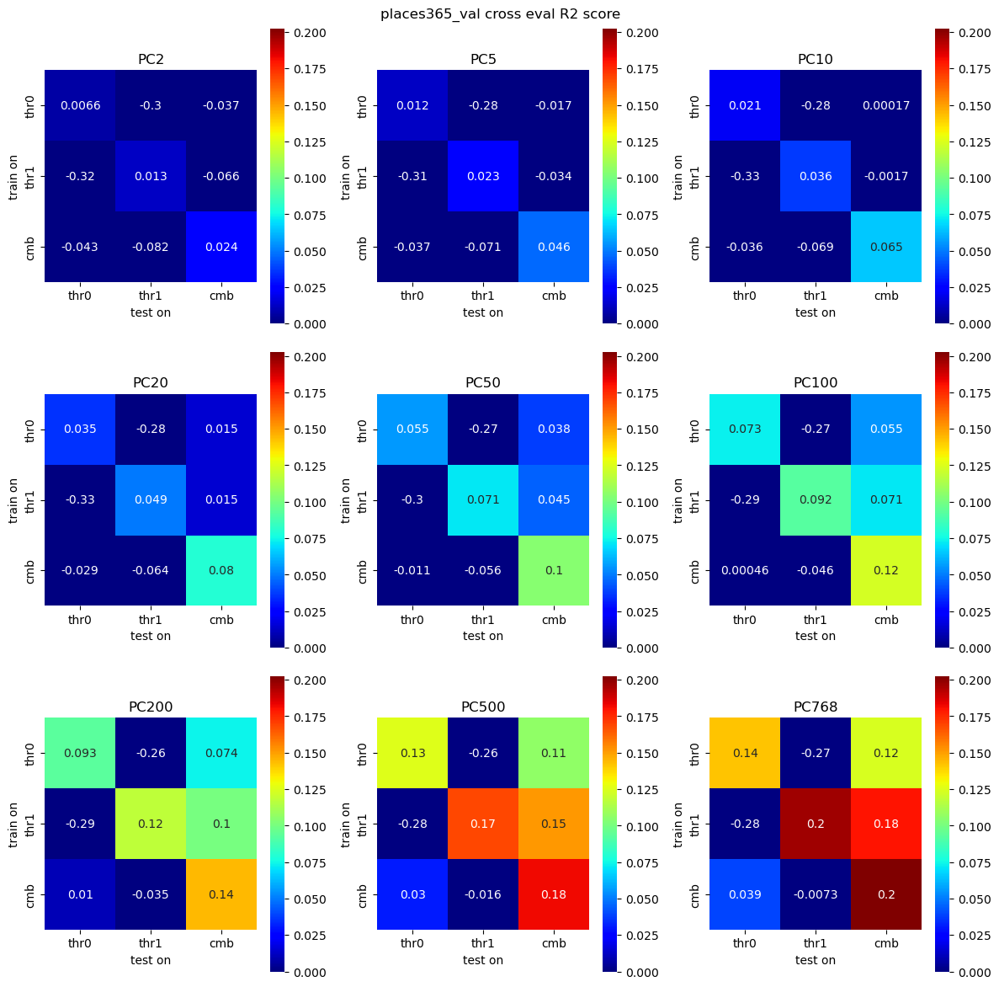

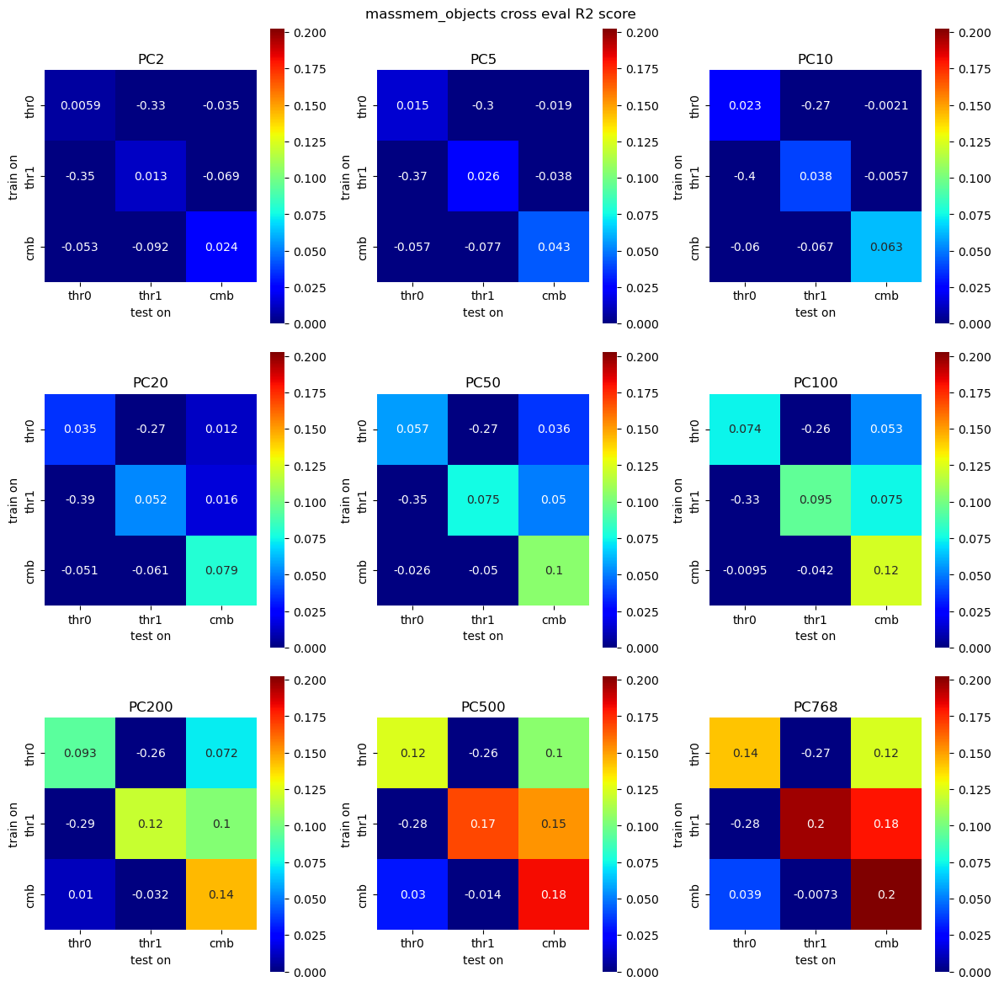

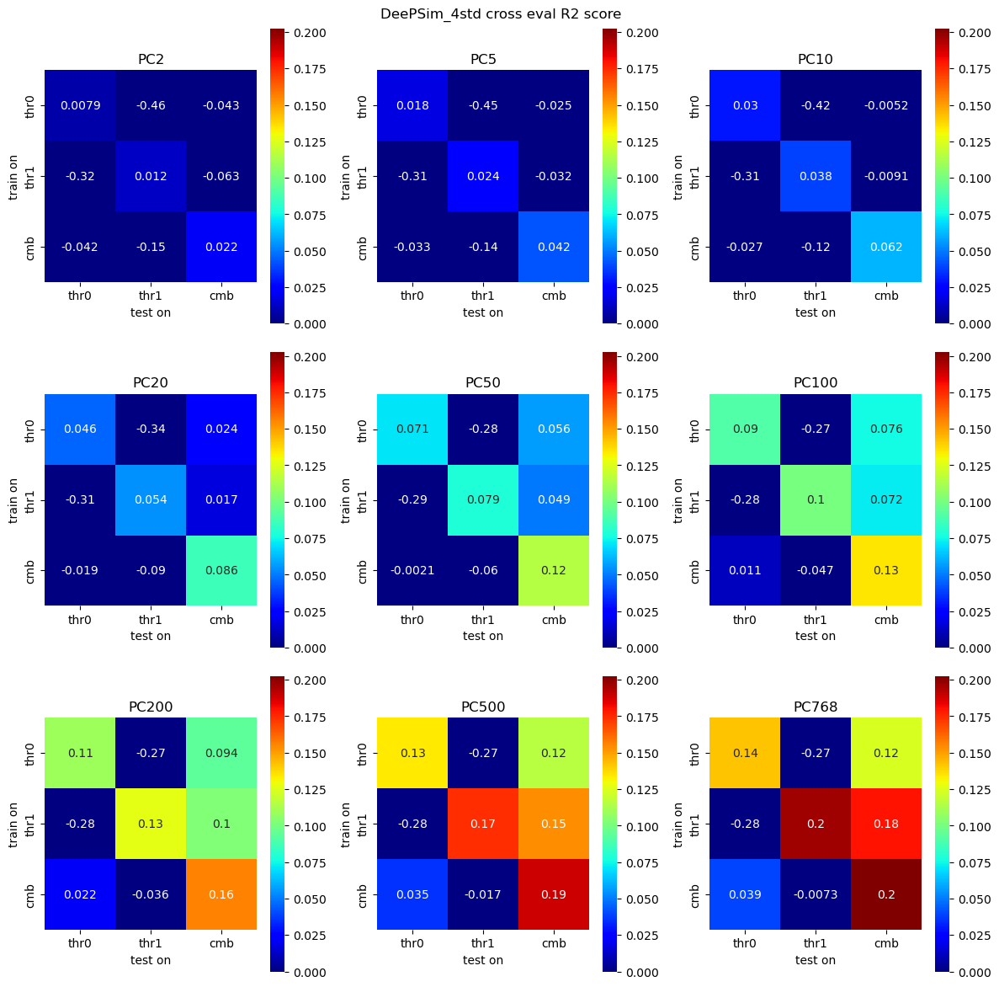

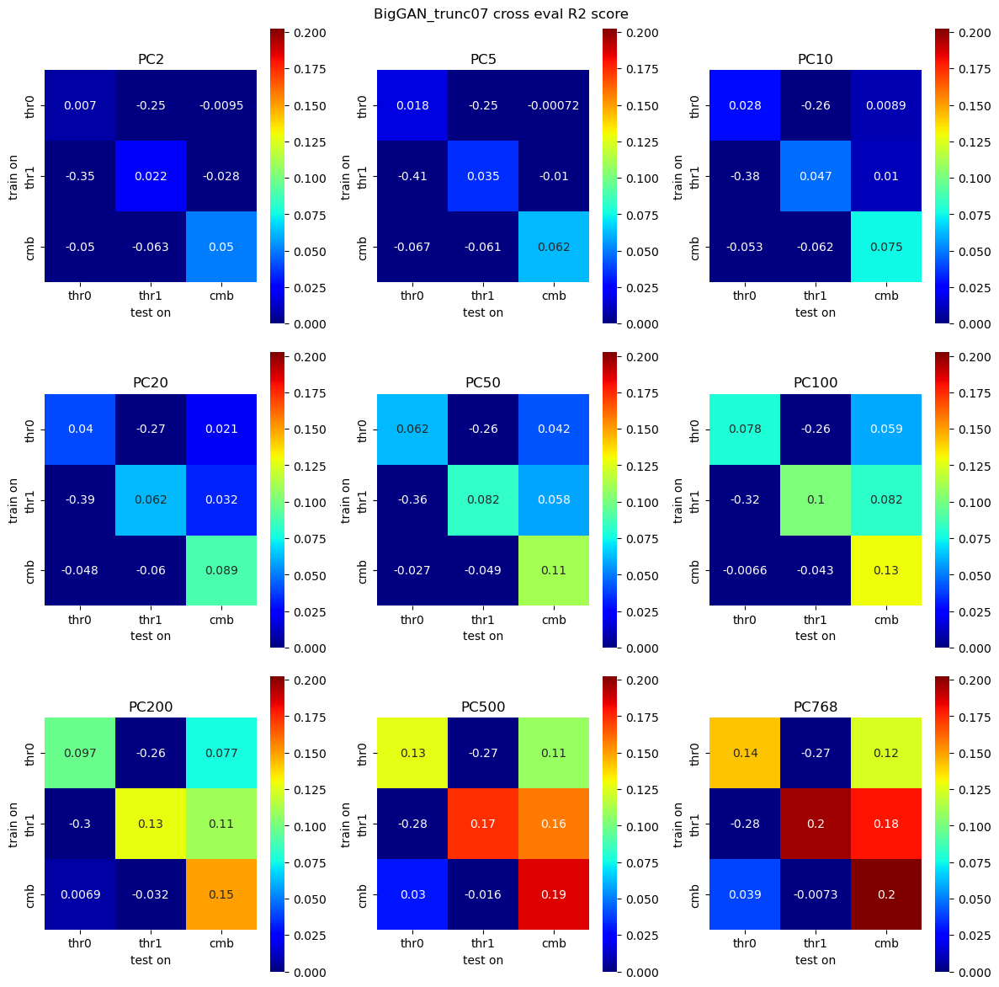

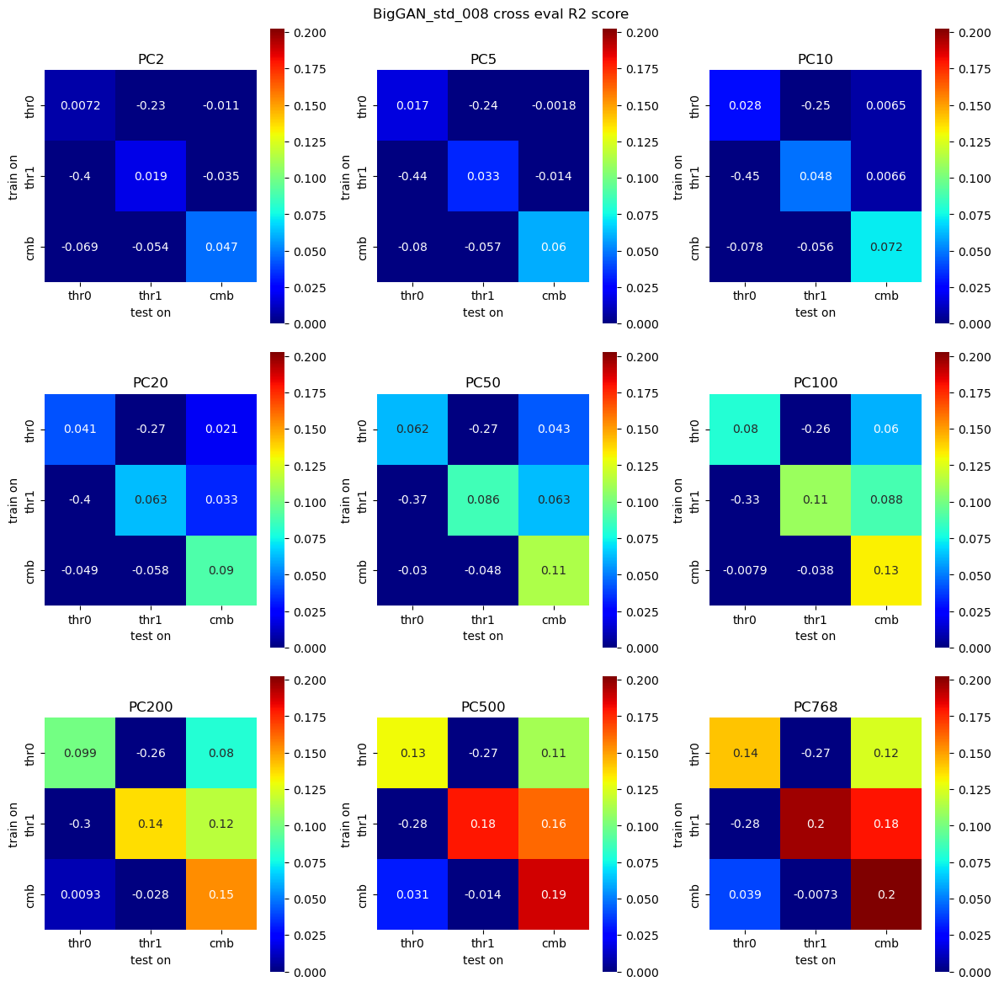

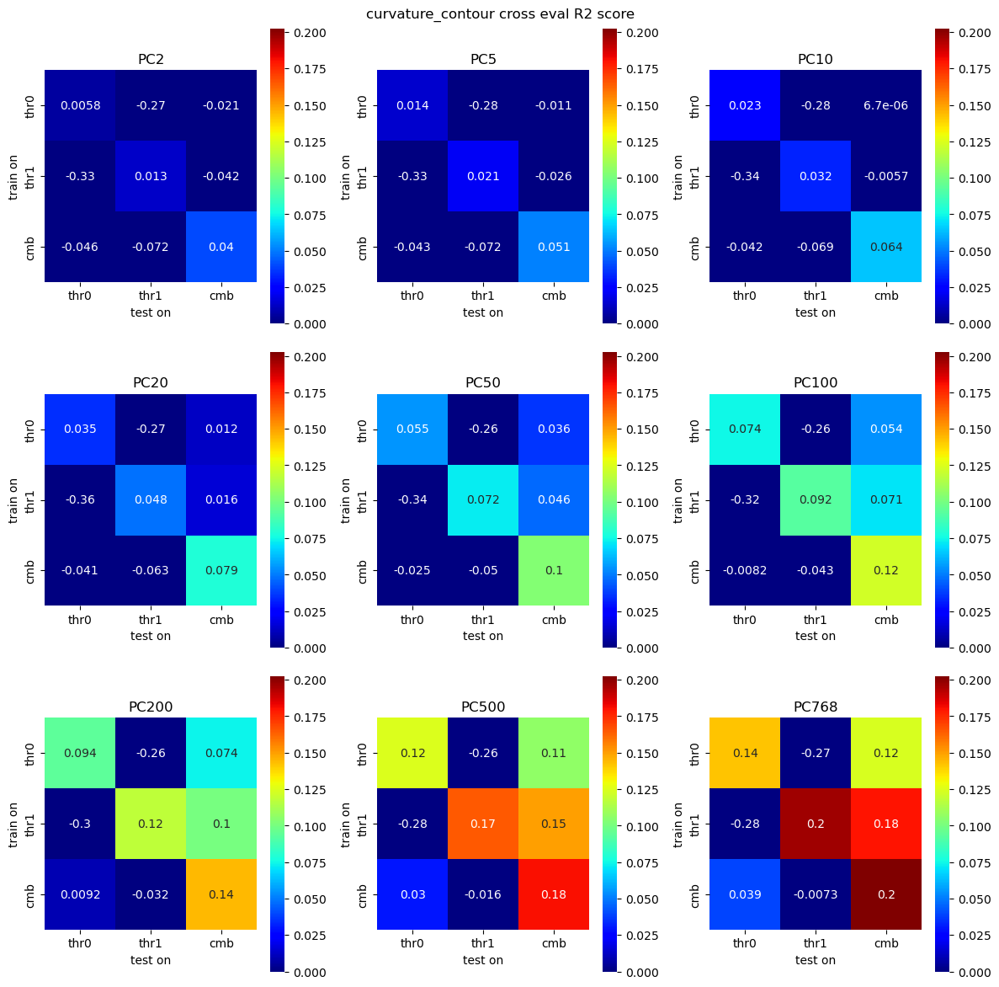

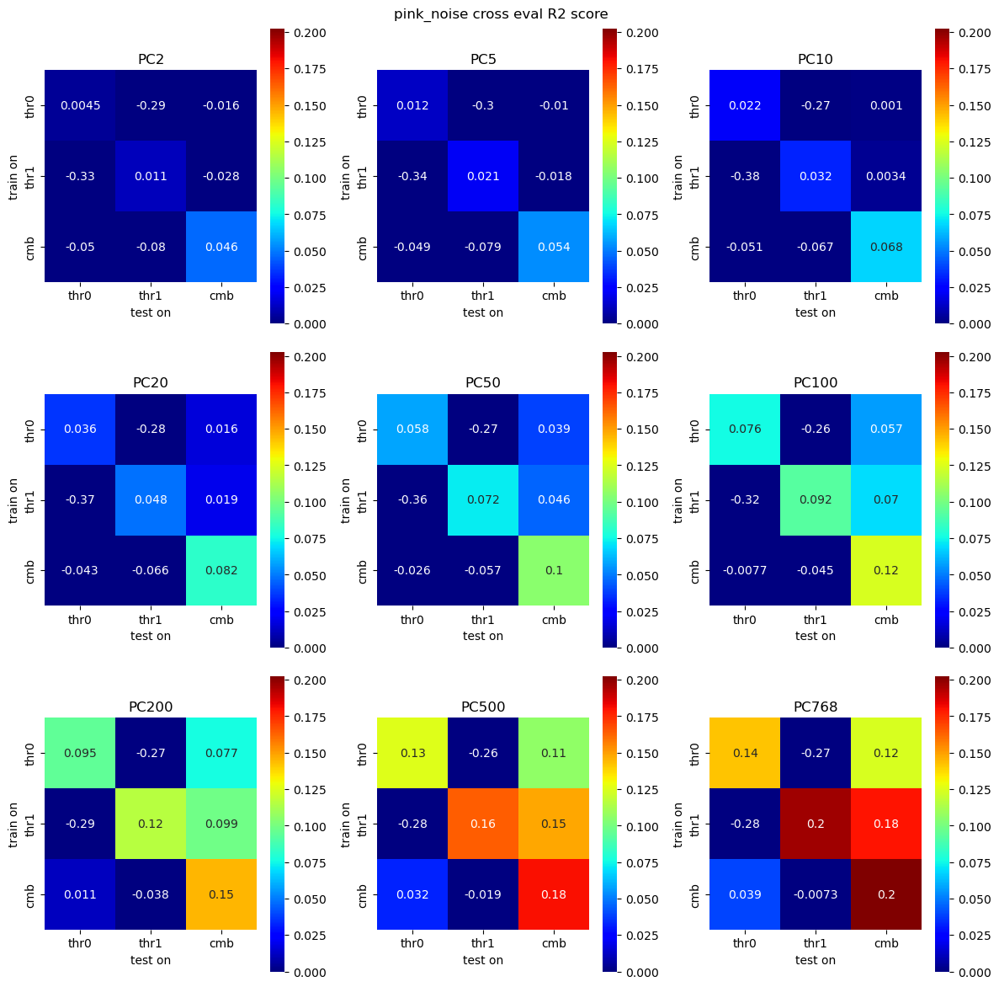

In [31]:
""" Directly visualizing the cross evaluation R2 score matrix for different datasets. """
for dataset_str in [
            "imagenet_valid",
            'ecoset_val',
            'places365_val',
            'massmem_objects',
            "DeePSim_4std",
            "BigGAN_trunc07",
            "BigGAN_std_008",
            'curvature_contour',
            "pink_noise",
        ]:
    stats_col_tsr = np.load(join(savedir, "summary", 
            f"Evol_regress_weights_dyna_synopsis_{dataset_str}_PC.npz"))
    cross_eval_mat_all = stats_col_tsr['cross_eval_mat']
    cross_eval_mat_avg = cross_eval_mat_all[validmsk.to_numpy()].mean(axis=0)
    plt.figure(figsize=[12, 12])
    vmax = np.max(cross_eval_mat_avg)
    for i, PCcutoff in enumerate(PCcutoff_list):
        plt.subplot(3, 3, i+1)
        sns.heatmap(cross_eval_mat_avg[i], annot=True, cmap="jet", 
                    vmin=0.0, vmax=vmax, square=True, 
                    xticklabels=["thr0", "thr1", "cmb"],
                    yticklabels=["thr0", "thr1", "cmb"])
        plt.title(f"PC{PCcutoff}")
        plt.ylabel("train on")
        plt.xlabel("test on")
    plt.suptitle(f"{dataset_str} cross eval R2 score")
    plt.tight_layout()
    plt.show()

Curve plot of prediction score as a function PC dataset and PC number:

In [46]:
stats_col_tsr['cross_eval_eachtime_tsr'].shape

(170, 9, 3, 3, 13)

In [53]:
""" Summarizing prediction scores across PC data, PC number and time window into a giant table for plotting."""
pred_score_col = []
for dataset_str in [
            "imagenet_valid",
            'ecoset_val',
            'places365_val',
            'massmem_objects',
            "DeePSim_4std",
            "BigGAN_trunc07",
            "BigGAN_std_008",
            'curvature_contour',
            "pink_noise",
        ]:
    stats_col_tsr = np.load(join(savedir, "summary", 
            f"Evol_regress_weights_dyna_synopsis_{dataset_str}_PC.npz"))
    cross_eval_mat_all = stats_col_tsr['cross_eval_mat']
    cross_eval_time_tsr_all = stats_col_tsr['cross_eval_eachtime_tsr']
    for msk, masklabel in [(validmsk, "valid"), 
                           (ITmsk & validmsk, "IT"),
                           (V4msk & validmsk, "V4"),
                           (V1msk & validmsk, "V1"),
                           (validmsk & bothsucs_msk, "valid_bothsucs"), 
                           (validmsk & bothsucs_msk & ITmsk, "IT_bothsucs"), 
                           (validmsk & bothsucs_msk & V4msk, "V4_bothsucs"), 
                           (validmsk & bothsucs_msk & V1msk, "V1_bothsucs"),
                           ]:
        cross_eval_mat_avg = cross_eval_mat_all[msk.to_numpy()].mean(axis=0)
        cross_eval_time_tsr_avg = cross_eval_time_tsr_all[msk.to_numpy()].mean(axis=0)
        for i, PCcutoff in enumerate(PCcutoff_list):
            S_dict = {"dataset": dataset_str, "PCcutoff": PCcutoff, 
                                    "data_split": masklabel,
                                    "score00": cross_eval_mat_avg[i][0, 0],
                                    "score11": cross_eval_mat_avg[i][1, 1],
                                    "score22": cross_eval_mat_avg[i][2, 2],
                                    "score01": cross_eval_mat_avg[i][0, 1],
                                    "score10": cross_eval_mat_avg[i][1, 0],
                                    "score_mat": cross_eval_mat_avg[i],
                                    }
            for j, rsp_wdw in enumerate(rsp_wdw_fine):
                S_dict[f"score00_{rsp_wdw[0]}-{rsp_wdw[-1]+1}"] = cross_eval_time_tsr_avg[i][0, 0, j]
                S_dict[f"score11_{rsp_wdw[0]}-{rsp_wdw[-1]+1}"] = cross_eval_time_tsr_avg[i][1, 1, j]
                S_dict[f"score22_{rsp_wdw[0]}-{rsp_wdw[-1]+1}"] = cross_eval_time_tsr_avg[i][2, 2, j]
                S_dict[f"score01_{rsp_wdw[0]}-{rsp_wdw[-1]+1}"] = cross_eval_time_tsr_avg[i][0, 1, j]
                S_dict[f"score10_{rsp_wdw[0]}-{rsp_wdw[-1]+1}"] = cross_eval_time_tsr_avg[i][1, 0, j]
            pred_score_col.append(S_dict)

pred_score_df = pd.DataFrame(pred_score_col)

In [49]:
pred_score_df[pred_score_df.data_split=="V4"].shape

(81, 74)

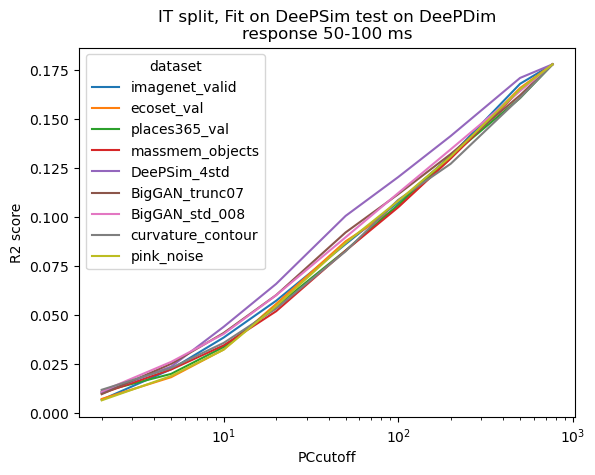

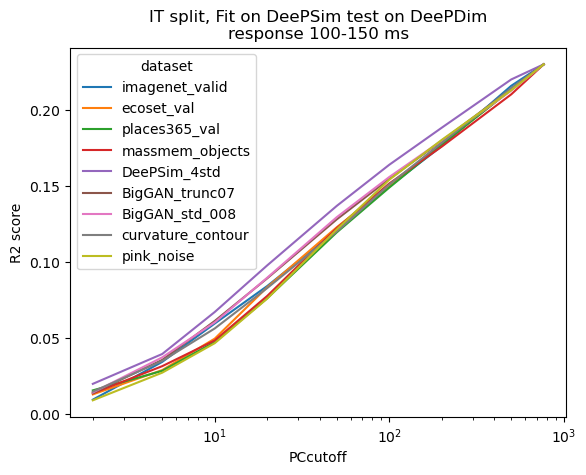

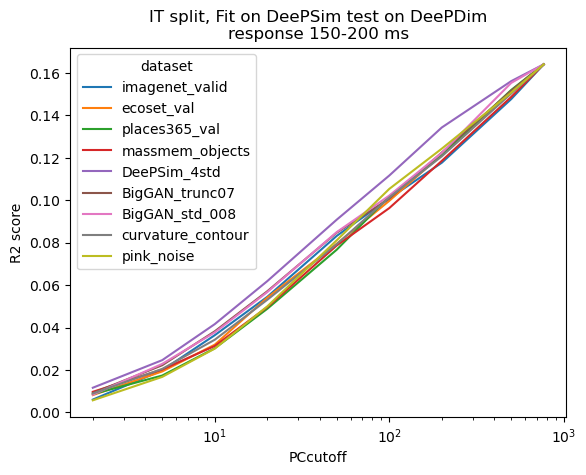

In [54]:
for wdw in [
    (50, 100), (100, 150), (150, 200)
]:
    plt.figure()
    sns.lineplot(data=pred_score_df[pred_score_df.data_split == "IT_bothsucs"], 
                x="PCcutoff", y=f"score00_{wdw[0]}-{wdw[1]}", hue="dataset")
    plt.xscale("log")
    plt.ylabel("R2 score")
    plt.title(f"IT split, Fit on DeePSim test on DeePDim\nresponse {wdw[0]}-{wdw[1]} ms")
    plt.show()

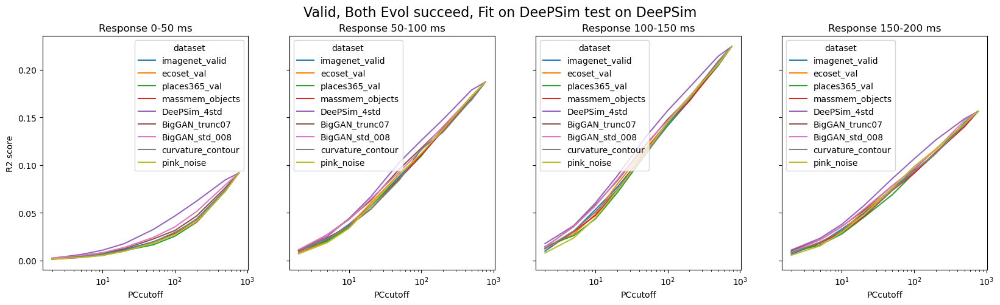

In [65]:
fig, axs = plt.subplots(1, 4, figsize=(20, 5), sharey=True)
fig.suptitle("Valid, Both Evol succeed, Fit on DeePSim test on DeePSim", fontsize=16)

for i, wdw in enumerate([(0, 50), (50, 100), (100, 150), (150, 200)]):
    ax = axs[i]
    sns.lineplot(data=pred_score_df[pred_score_df.data_split == "valid_bothsucs"], 
                 x="PCcutoff", y=f"score00_{wdw[0]}-{wdw[1]}", hue="dataset", ax=ax)
    ax.set_xscale("log")
    ax.set_ylabel("R2 score")
    ax.set_title(f"Response {wdw[0]}-{wdw[1]} ms")

plt.show()

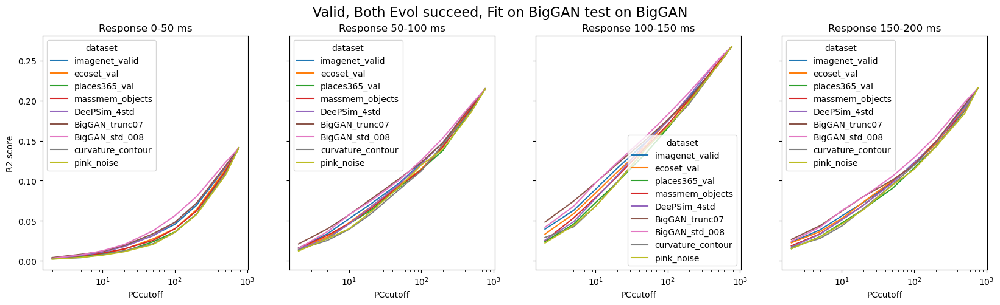

In [66]:
fig, axs = plt.subplots(1, 4, figsize=(20, 5), sharey=True)
fig.suptitle("Valid, Both Evol succeed, Fit on BigGAN test on BigGAN", fontsize=16)

for i, wdw in enumerate([(0, 50), (50, 100), (100, 150), (150, 200)]):
    ax = axs[i]
    sns.lineplot(data=pred_score_df[pred_score_df.data_split == "valid_bothsucs"], 
                 x="PCcutoff", y=f"score11_{wdw[0]}-{wdw[1]}", hue="dataset", ax=ax)
    ax.set_xscale("log")
    ax.set_ylabel("R2 score")
    ax.set_title(f"Response {wdw[0]}-{wdw[1]} ms")

plt.show()

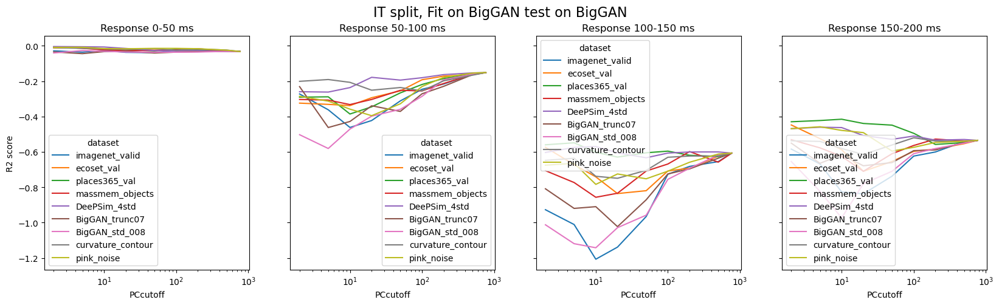

In [59]:
fig, axs = plt.subplots(1, 4, figsize=(20, 5), sharey=True)
fig.suptitle("IT split, Fit on BigGAN test on BigGAN", fontsize=16)

for i, wdw in enumerate([(0, 50), (50, 100), (100, 150), (150, 200)]):
    ax = axs[i]
    sns.lineplot(data=pred_score_df[pred_score_df.data_split == "IT_bothsucs"], 
                 x="PCcutoff", y=f"score10_{wdw[0]}-{wdw[1]}", hue="dataset", ax=ax)
    ax.set_xscale("log")
    ax.set_ylabel("R2 score")
    ax.set_title(f"Response {wdw[0]}-{wdw[1]} ms")

plt.show()


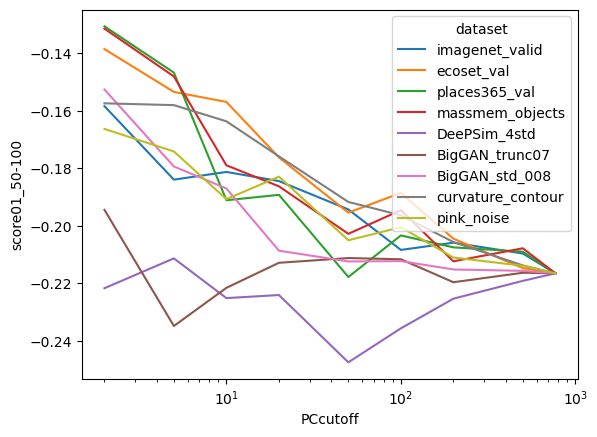

In [55]:
sns.lineplot(data=pred_score_df[pred_score_df.data_split=="IT"], 
             x="PCcutoff", y="score01_50-100", hue="dataset")
plt.xscale("log")
plt.show()

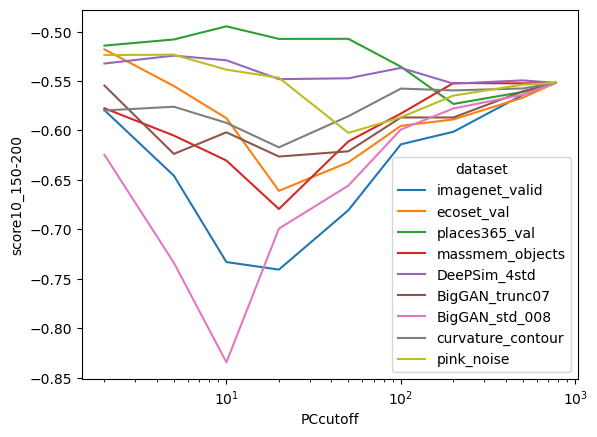

In [28]:
sns.lineplot(data=pred_score_df[pred_score_df.data_split=="IT"], 
             x="PCcutoff", y="score10_150-200", hue="dataset")
plt.xscale("log")
plt.show()

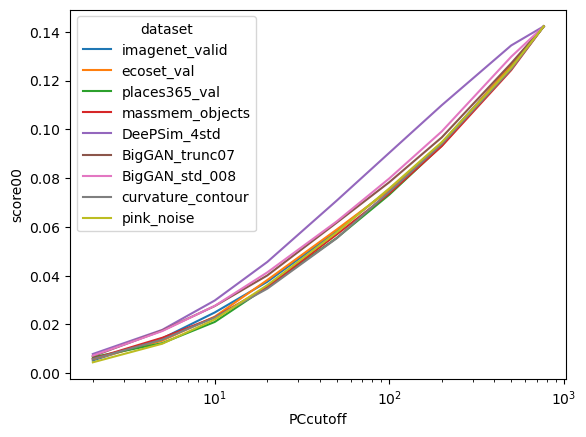

In [45]:
sns.lineplot(data=pred_score_df[pred_score_df.data_split=="valid"], 
             x="PCcutoff", y="score00", hue="dataset")
plt.xscale("log")
plt.show()

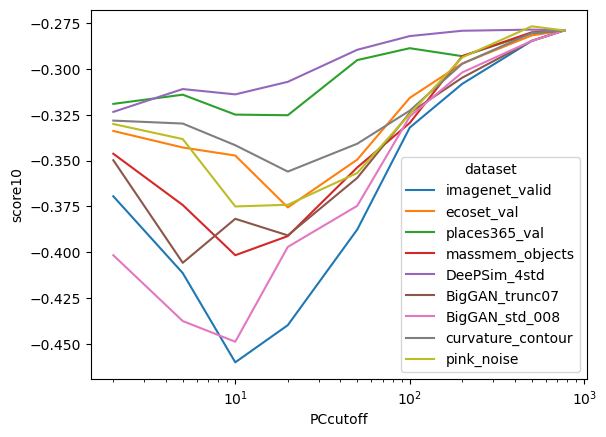

In [44]:
sns.lineplot(data=pred_score_df[pred_score_df.data_split=="valid"], 
             x="PCcutoff", y="score10", hue="dataset")
plt.xscale("log")
plt.show()

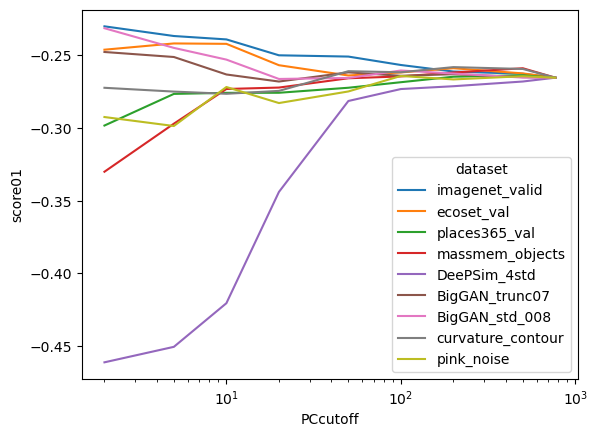

In [43]:
sns.lineplot(data=pred_score_df[pred_score_df.data_split=="valid"], 
             x="PCcutoff", y="score01", hue="dataset")
plt.xscale("log")
plt.show()

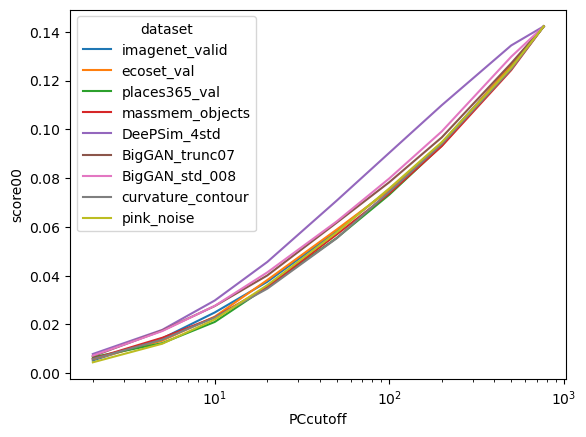

In [35]:
sns.lineplot(data=pred_score_df[pred_score_df.data_split=="valid"], 
             x="PCcutoff", y="score00", hue="dataset")
plt.xscale("log")
plt.show()

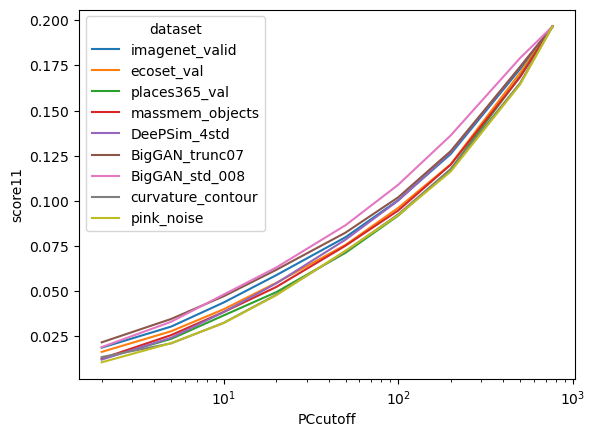

In [33]:
sns.lineplot(data=pred_score_df[pred_score_df.data_split=="valid"], 
             x="PCcutoff", y="score11", hue="dataset")
plt.xscale("log")
plt.show()

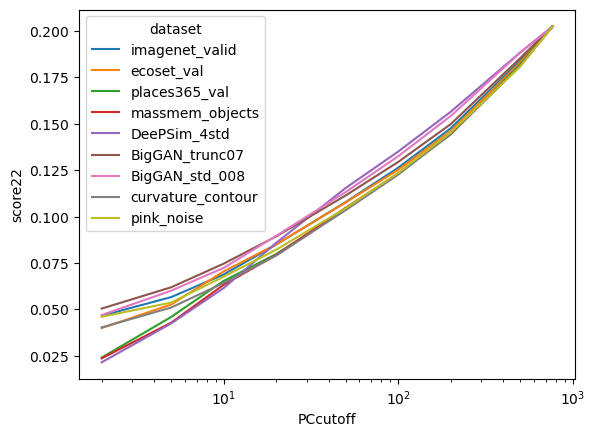

In [34]:
sns.lineplot(data=pred_score_df[pred_score_df.data_split=="valid"], 
             x="PCcutoff", y="score22", hue="dataset")
plt.xscale("log")
plt.show()

### Dynamics of encoding axes

In [40]:
["imagenet_valid",
'ecoset_val',
'places365_val',
'massmem_objects',
"DeePSim_4std",
"BigGAN_trunc07",
"BigGAN_std_008",
'curvature_contour',
"pink_noise",]

['imagenet_valid',
 'ecoset_val',
 'places365_val',
 'massmem_objects',
 'DeePSim_4std',
 'BigGAN_trunc07',
 'BigGAN_std_008',
 'curvature_contour',
 'pink_noise']

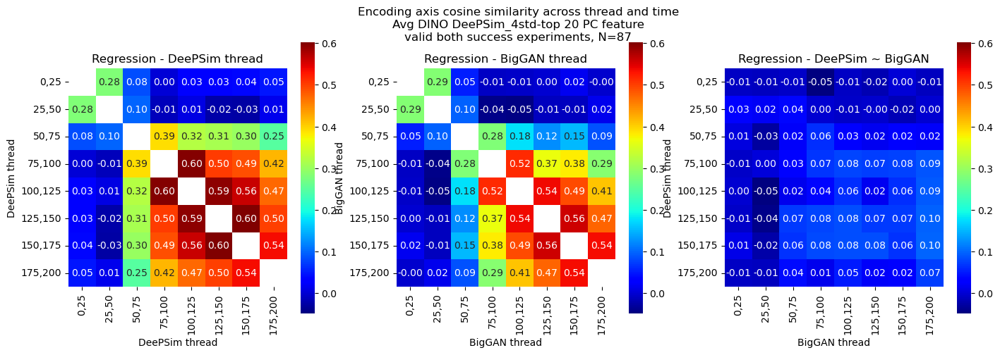

In [73]:
dataset_str = "DeePSim_4std"
msk = validmsk & bothsucs_msk
msk_str = f"valid both success experiments, N={msk.sum()}"
PCcutoff = 20
slc = slice(-8, None)
PCi = [2, 5, 10, 20, 50, 100, 200, 500, 768].index(PCcutoff)
stats_col_tsr = np.load(join(savedir, "summary", 
        f"Evol_regress_weights_dyna_synopsis_{dataset_str}_PC.npz"))
data = [stats_col_tsr["cossim00"][msk, PCi].mean(axis=0)[slc,slc], 
        stats_col_tsr["cossim11"][msk, PCi].mean(axis=0)[slc,slc], 
        stats_col_tsr["cossim01"][msk, PCi].mean(axis=0)[slc,slc]]
label_xys = [("DeePSim thread", "DeePSim thread"), 
            ("BigGAN thread", "BigGAN thread"),
            ("BigGAN thread", "DeePSim thread")]
title = ["Regression - DeePSim thread", "Regression - BigGAN thread", "Regression - DeePSim ~ BigGAN"]
figh, axs = plot_heatmap(data, timewdw_strs[slc], timewdw_strs[slc], label_xys, title)
figh.suptitle(f"Encoding axis cosine similarity across thread and time\nAvg {'DINO'} {dataset_str}-top {PCcutoff} PC feature\n{msk_str}")
figh.show()

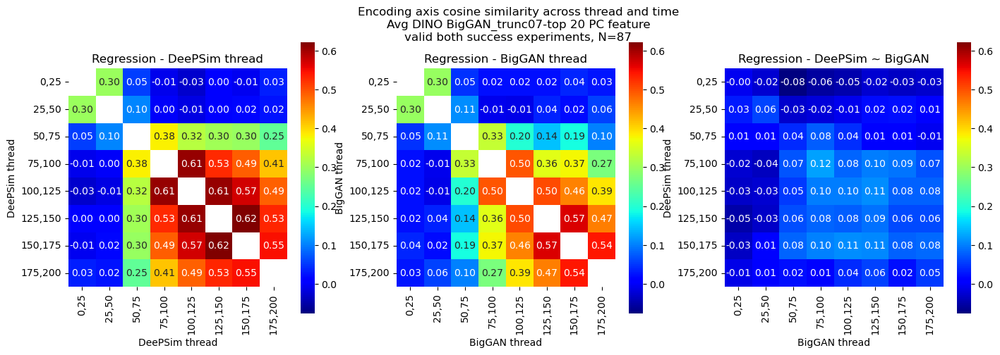

In [72]:
dataset_str = "BigGAN_trunc07"
msk = validmsk & bothsucs_msk
msk_str = f"valid both success experiments, N={msk.sum()}"
PCcutoff = 20
slc = slice(-8, None)
PCi = [2, 5, 10, 20, 50, 100, 200, 500, 768].index(PCcutoff)
stats_col_tsr = np.load(join(savedir, "summary", 
        f"Evol_regress_weights_dyna_synopsis_{dataset_str}_PC.npz"))
data = [stats_col_tsr["cossim00"][msk, PCi].mean(axis=0)[slc,slc], 
        stats_col_tsr["cossim11"][msk, PCi].mean(axis=0)[slc,slc], 
        stats_col_tsr["cossim01"][msk, PCi].mean(axis=0)[slc,slc]]
label_xys = [("DeePSim thread", "DeePSim thread"), 
            ("BigGAN thread", "BigGAN thread"),
            ("BigGAN thread", "DeePSim thread")]
title = ["Regression - DeePSim thread", "Regression - BigGAN thread", "Regression - DeePSim ~ BigGAN"]
figh, axs = plot_heatmap(data, timewdw_strs[slc], timewdw_strs[slc], label_xys, title)
figh.suptitle(f"Encoding axis cosine similarity across thread and time\nAvg {'DINO'} {dataset_str}-top {PCcutoff} PC feature\n{msk_str}")
figh.show()

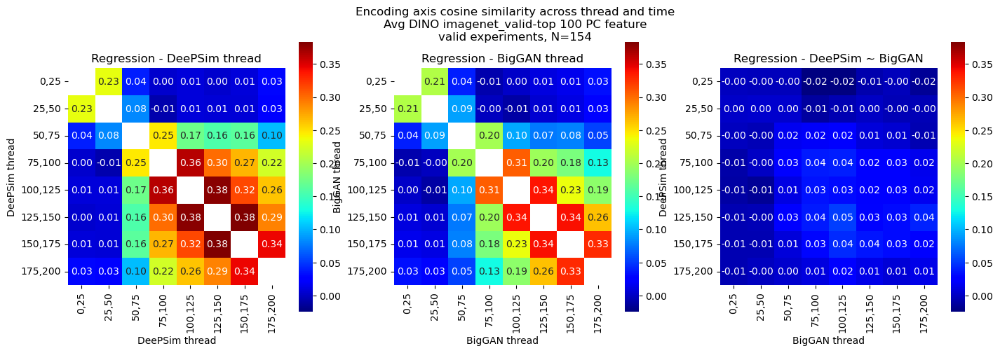

In [41]:
dataset_str = "imagenet_valid"
msk = validmsk
msk_str = f"valid experiments, N={msk.sum()}"
PCcutoff = 100
slc = slice(-8, None)
PCi = [2, 5, 10, 20, 50, 100, 200, 500, 768].index(PCcutoff)
stats_col_tsr = np.load(join(savedir, "summary", 
        f"Evol_regress_weights_dyna_synopsis_{dataset_str}_PC.npz"))
data = [stats_col_tsr["cossim00"][msk, PCi].mean(axis=0)[slc,slc], 
        stats_col_tsr["cossim11"][msk, PCi].mean(axis=0)[slc,slc], 
        stats_col_tsr["cossim01"][msk, PCi].mean(axis=0)[slc,slc]]
label_xys = [("DeePSim thread", "DeePSim thread"), 
            ("BigGAN thread", "BigGAN thread"),
            ("BigGAN thread", "DeePSim thread")]
title = ["Regression - DeePSim thread", "Regression - BigGAN thread", "Regression - DeePSim ~ BigGAN"]
figh, axs = plot_heatmap(data, timewdw_strs[slc], timewdw_strs[slc], label_xys, title)
figh.suptitle(f"Encoding axis cosine similarity across thread and time\nAvg {'DINO'} {dataset_str}-top {PCcutoff} PC feature\n{msk_str}")
figh.show()

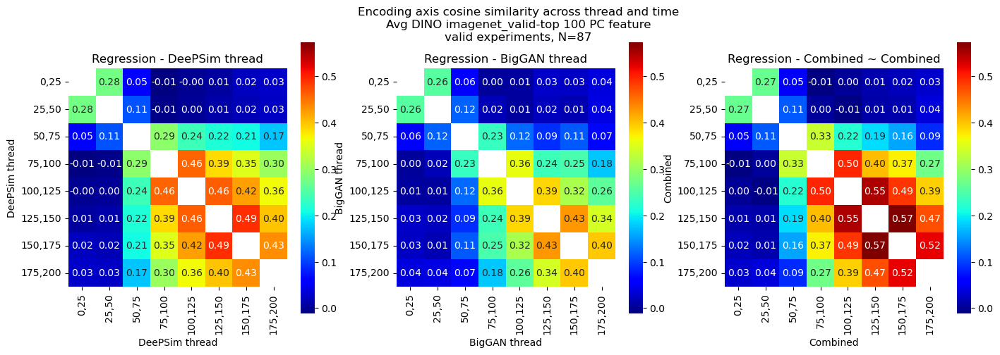

In [87]:
dataset_str = "imagenet_valid"
msk = validmsk & bothsucs_msk
msk_str = f"valid experiments, N={msk.sum()}"
PCcutoff = 100
slc = slice(-8, None)
PCi = [2, 5, 10, 20, 50, 100, 200, 500, 768].index(PCcutoff)
stats_col_tsr = np.load(join(savedir, "summary", 
        f"Evol_regress_weights_dyna_synopsis_{dataset_str}_PC.npz"))
data = [stats_col_tsr["cossim00"][msk, PCi].mean(axis=0)[slc,slc], 
        stats_col_tsr["cossim11"][msk, PCi].mean(axis=0)[slc,slc], 
        stats_col_tsr["cossim22"][msk, PCi].mean(axis=0)[slc,slc]]
label_xys = [("DeePSim thread", "DeePSim thread"), 
            ("BigGAN thread", "BigGAN thread"),
            ("Combined", "Combined")]
title = ["Regression - DeePSim thread", "Regression - BigGAN thread", "Regression - Combined ~ Combined"]
figh, axs = plot_heatmap(data, timewdw_strs[slc], timewdw_strs[slc], label_xys, title)
figh.suptitle(f"Encoding axis cosine similarity across thread and time\nAvg {'DINO'} {dataset_str}-top {PCcutoff} PC feature\n{msk_str}")
figh.show()

In [81]:
list(stats_col_tsr)

['cossim00',
 'cossim11',
 'cossim01',
 'cross_eval_mat',
 'cross_eval_eachtime_tsr',
 'PCcutoff_list',
 'rsp_wdw_fine']

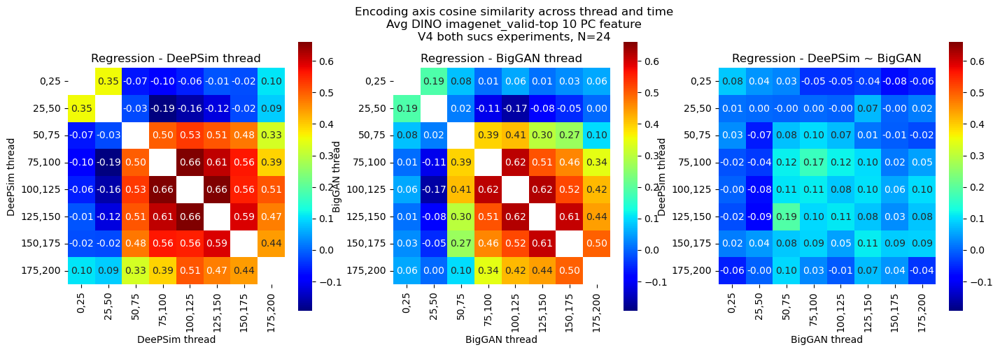

In [89]:
dataset_str = "imagenet_valid"
msk = validmsk & V4msk & bothsucs_msk
msk_str = f"V4 both sucs experiments, N={msk.sum()}"
PCcutoff = 10
slc = slice(-8, None)
PCi = [2, 5, 10, 20, 50, 100, 200, 500, 768].index(PCcutoff)
stats_col_tsr = np.load(join(savedir, "summary", 
        f"Evol_regress_weights_dyna_synopsis_{dataset_str}_PC.npz"))
data = [stats_col_tsr["cossim00"][msk, PCi].mean(axis=0)[slc,slc], 
        stats_col_tsr["cossim11"][msk, PCi].mean(axis=0)[slc,slc], 
        stats_col_tsr["cossim01"][msk, PCi].mean(axis=0)[slc,slc]]
label_xys = [("DeePSim thread", "DeePSim thread"), 
            ("BigGAN thread", "BigGAN thread"),
            ("BigGAN thread", "DeePSim thread")]
title = ["Regression - DeePSim thread", "Regression - BigGAN thread", "Regression - DeePSim ~ BigGAN"]
figh, axs = plot_heatmap(data, timewdw_strs[slc], timewdw_strs[slc], label_xys, title)
figh.suptitle(f"Encoding axis cosine similarity across thread and time\nAvg {'DINO'} {dataset_str}-top {PCcutoff} PC feature\n{msk_str}")
figh.show()

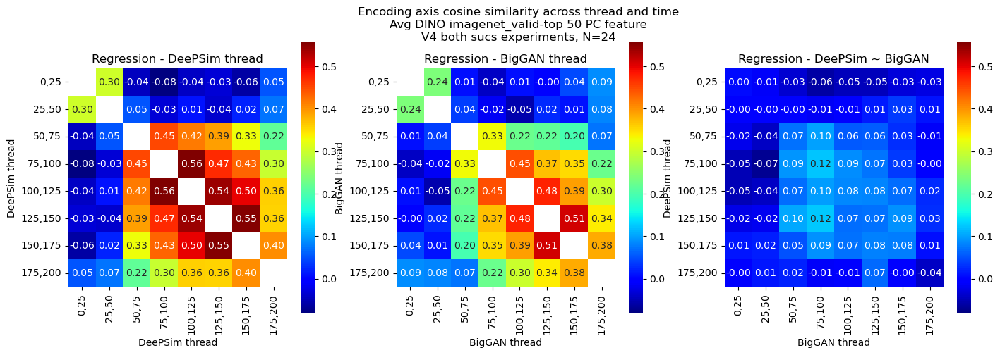

In [88]:
dataset_str = "imagenet_valid"
msk = validmsk & V4msk & bothsucs_msk
msk_str = f"V4 both sucs experiments, N={msk.sum()}"
PCcutoff = 50
slc = slice(-8, None)
PCi = [2, 5, 10, 20, 50, 100, 200, 500, 768].index(PCcutoff)
stats_col_tsr = np.load(join(savedir, "summary", 
        f"Evol_regress_weights_dyna_synopsis_{dataset_str}_PC.npz"))
data = [stats_col_tsr["cossim00"][msk, PCi].mean(axis=0)[slc,slc], 
        stats_col_tsr["cossim11"][msk, PCi].mean(axis=0)[slc,slc], 
        stats_col_tsr["cossim01"][msk, PCi].mean(axis=0)[slc,slc]]
label_xys = [("DeePSim thread", "DeePSim thread"), 
            ("BigGAN thread", "BigGAN thread"),
            ("BigGAN thread", "DeePSim thread")]
title = ["Regression - DeePSim thread", "Regression - BigGAN thread", "Regression - DeePSim ~ BigGAN"]
figh, axs = plot_heatmap(data, timewdw_strs[slc], timewdw_strs[slc], label_xys, title)
figh.suptitle(f"Encoding axis cosine similarity across thread and time\nAvg {'DINO'} {dataset_str}-top {PCcutoff} PC feature\n{msk_str}")
figh.show()

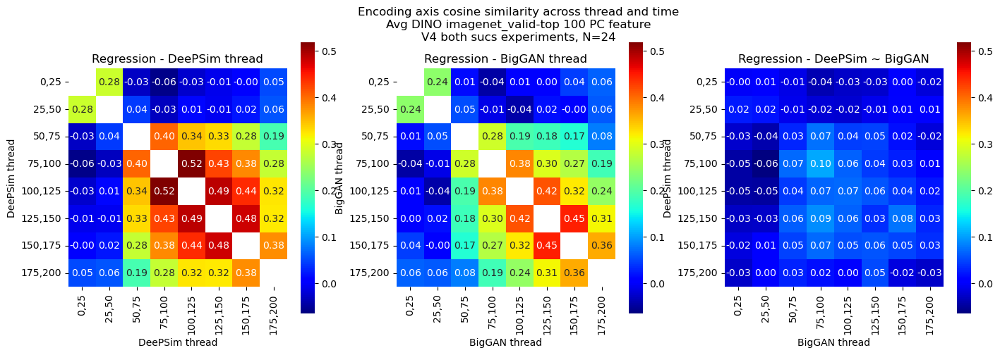

In [ ]:
dataset_str = "imagenet_valid"
msk = validmsk & V4msk & bothsucs_msk
msk_str = f"V4 both sucs experiments, N={msk.sum()}"
PCcutoff = 100
slc = slice(-8, None)
PCi = [2, 5, 10, 20, 50, 100, 200, 500, 768].index(PCcutoff)
stats_col_tsr = np.load(join(savedir, "summary", 
        f"Evol_regress_weights_dyna_synopsis_{dataset_str}_PC.npz"))
data = [stats_col_tsr["cossim00"][msk, PCi].mean(axis=0)[slc,slc], 
        stats_col_tsr["cossim11"][msk, PCi].mean(axis=0)[slc,slc], 
        stats_col_tsr["cossim01"][msk, PCi].mean(axis=0)[slc,slc]]
label_xys = [("DeePSim thread", "DeePSim thread"), 
            ("BigGAN thread", "BigGAN thread"),
            ("BigGAN thread", "DeePSim thread")]
title = ["Regression - DeePSim thread", "Regression - BigGAN thread", "Regression - DeePSim ~ BigGAN"]
figh, axs = plot_heatmap(data, timewdw_strs[slc], timewdw_strs[slc], label_xys, title)
figh.suptitle(f"Encoding axis cosine similarity across thread and time\nAvg {'DINO'} {dataset_str}-top {PCcutoff} PC feature\n{msk_str}")
figh.show()

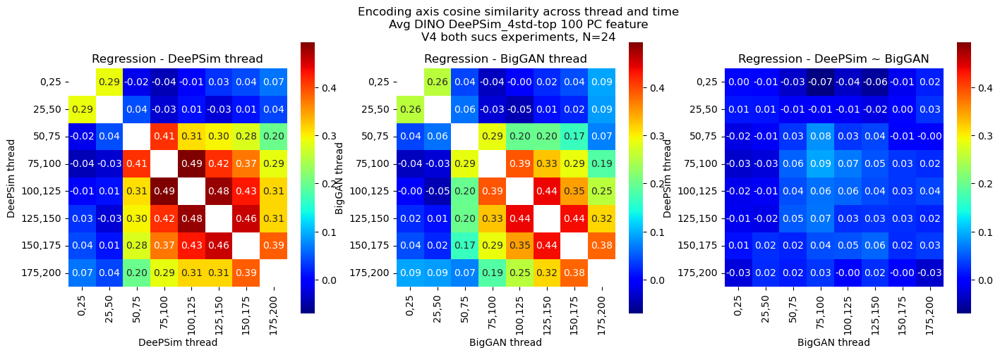

In [77]:
dataset_str = "DeePSim_4std"
msk = validmsk & V4msk & bothsucs_msk
msk_str = f"V4 both sucs experiments, N={msk.sum()}"
PCcutoff = 100
slc = slice(-8, None)
PCi = [2, 5, 10, 20, 50, 100, 200, 500, 768].index(PCcutoff)
stats_col_tsr = np.load(join(savedir, "summary", 
        f"Evol_regress_weights_dyna_synopsis_{dataset_str}_PC.npz"))
data = [stats_col_tsr["cossim00"][msk, PCi].mean(axis=0)[slc,slc], 
        stats_col_tsr["cossim11"][msk, PCi].mean(axis=0)[slc,slc], 
        stats_col_tsr["cossim01"][msk, PCi].mean(axis=0)[slc,slc]]
label_xys = [("DeePSim thread", "DeePSim thread"), 
            ("BigGAN thread", "BigGAN thread"),
            ("BigGAN thread", "DeePSim thread")]
title = ["Regression - DeePSim thread", "Regression - BigGAN thread", "Regression - DeePSim ~ BigGAN"]
figh, axs = plot_heatmap(data, timewdw_strs[slc], timewdw_strs[slc], label_xys, title)
figh.suptitle(f"Encoding axis cosine similarity across thread and time\nAvg {'DINO'} {dataset_str}-top {PCcutoff} PC feature\n{msk_str}")
figh.show()

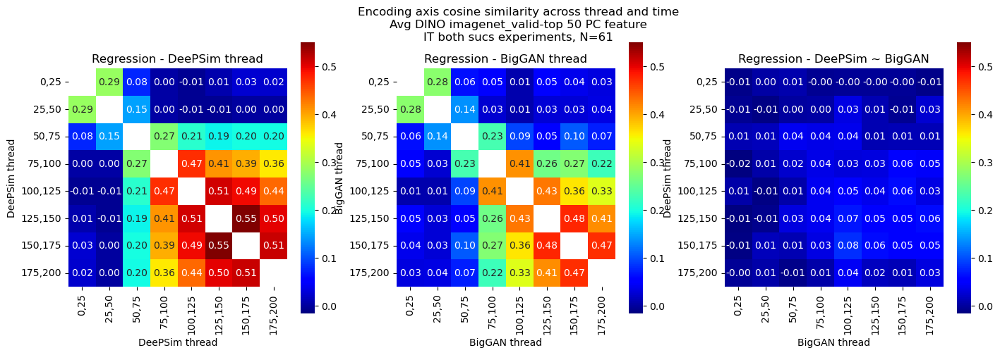

In [78]:
dataset_str = "imagenet_valid"
msk = validmsk & ITmsk & bothsucs_msk
msk_str = f"IT both sucs experiments, N={msk.sum()}"
PCcutoff = 50
slc = slice(-8, None)
PCi = [2, 5, 10, 20, 50, 100, 200, 500, 768].index(PCcutoff)
stats_col_tsr = np.load(join(savedir, "summary", 
        f"Evol_regress_weights_dyna_synopsis_{dataset_str}_PC.npz"))
data = [stats_col_tsr["cossim00"][msk, PCi].mean(axis=0)[slc,slc], 
        stats_col_tsr["cossim11"][msk, PCi].mean(axis=0)[slc,slc], 
        stats_col_tsr["cossim01"][msk, PCi].mean(axis=0)[slc,slc]]
label_xys = [("DeePSim thread", "DeePSim thread"), 
            ("BigGAN thread", "BigGAN thread"),
            ("BigGAN thread", "DeePSim thread")]
title = ["Regression - DeePSim thread", "Regression - BigGAN thread", "Regression - DeePSim ~ BigGAN"]
figh, axs = plot_heatmap(data, timewdw_strs[slc], timewdw_strs[slc], label_xys, title)
figh.suptitle(f"Encoding axis cosine similarity across thread and time\nAvg {'DINO'} {dataset_str}-top {PCcutoff} PC feature\n{msk_str}")
figh.show()

### Masked partial session synopsis

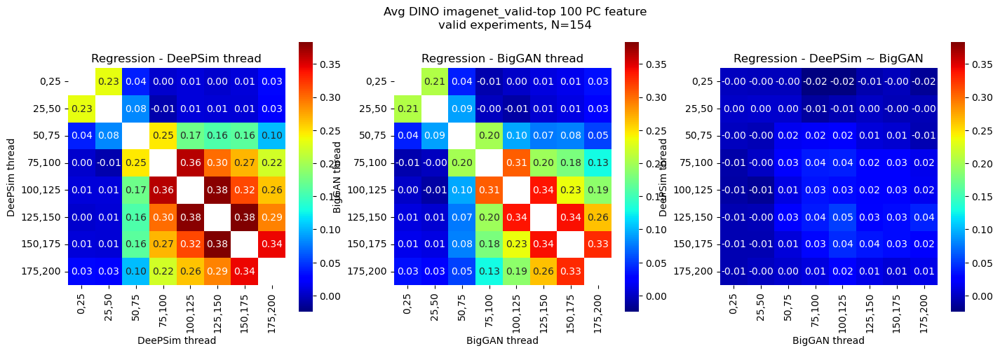

In [ ]:
msk = validmsk
msk_str = f"valid experiments, N={msk.sum()}"
PCcutoff = 100
slc = slice(-8, None)
PCi = [2, 5, 10, 20, 50, 100, 200, 500, 768].index(PCcutoff)
data = [stats_col_tsr["cossim00"][msk, PCi].mean(axis=0)[slc,slc], 
        stats_col_tsr["cossim11"][msk, PCi].mean(axis=0)[slc,slc], 
        stats_col_tsr["cossim01"][msk, PCi].mean(axis=0)[slc,slc]]
label_xys = [("DeePSim thread", "DeePSim thread"), 
            ("BigGAN thread", "BigGAN thread"),
            ("BigGAN thread", "DeePSim thread")]
title = ["Regression - DeePSim thread", "Regression - BigGAN thread", "Regression - DeePSim ~ BigGAN"]
figh, axs = plot_heatmap(data, timewdw_strs[slc], timewdw_strs[slc], label_xys, title)
figh.suptitle(f"Encoding axis cosine similarity across thread and time\nAvg {'DINO'} {dataset_str}-top {PCcutoff} PC feature\n{msk_str}")
figh.show()

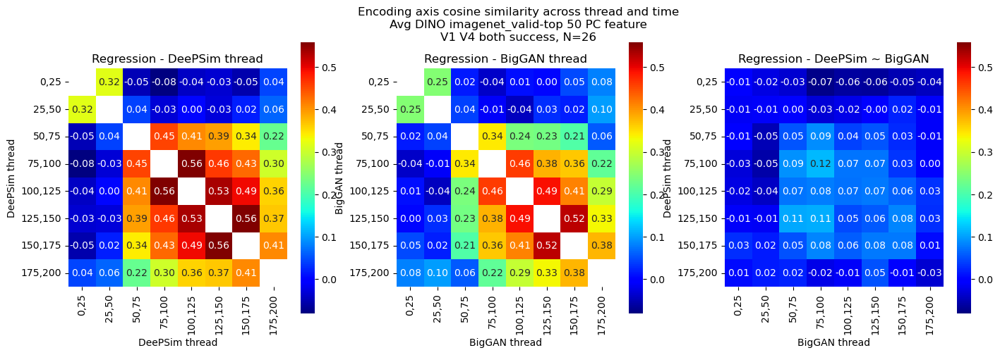

In [ ]:
msk = (validmsk & bothsucs_msk & (V1msk | V4msk)).to_numpy()
msk_str = f"V1 V4 both success, N={msk.sum()}"
PCcutoff = 50
slc = slice(-8, None)
PCi = [2, 5, 10, 20, 50, 100, 200, 500, 768].index(PCcutoff)
data = [stats_col_tsr["cossim00"][msk, PCi].mean(axis=0)[slc,slc], 
        stats_col_tsr["cossim11"][msk, PCi].mean(axis=0)[slc,slc], 
        stats_col_tsr["cossim01"][msk, PCi].mean(axis=0)[slc,slc]]
label_xys = [("DeePSim thread", "DeePSim thread"), 
            ("BigGAN thread", "BigGAN thread"),
            ("BigGAN thread", "DeePSim thread")]
title = ["Regression - DeePSim thread", "Regression - BigGAN thread", "Regression - DeePSim ~ BigGAN"]
figh, axs = plot_heatmap(data, timewdw_strs[slc], timewdw_strs[slc], label_xys, title)
figh.suptitle(f"Encoding axis cosine similarity across thread and time\nAvg {'DINO'} {dataset_str}-top {PCcutoff} PC feature\n{msk_str}")
figh.show()

In [ ]:
ttest_1samp(stats_col_tsr["cossim01"][msk, PCi][:, slc,slc], popmean=0.0, axis=0, )

TtestResult(statistic=array([[-0.274, -0.764, -1.072, -2.915, -2.513, -2.157, -1.488, -1.307],
       [-0.529, -0.471,  0.07 , -0.863, -0.561, -0.065,  0.696, -0.326],
       [-0.19 , -2.101,  1.916,  2.937,  1.395,  1.753,  1.117, -0.396],
       [-1.027, -1.85 ,  4.43 ,  3.799,  2.225,  2.381,  1.191,  0.032],
       [-0.783, -1.461,  3.156,  2.296,  2.019,  2.327,  1.657,  1.056],
       [-0.468, -0.502,  4.547,  2.801,  1.141,  1.597,  2.431,  0.851],
       [ 0.89 ,  0.685,  1.667,  2.864,  2.172,  2.318,  2.987,  0.242],
       [ 0.27 ,  0.578,  0.79 , -0.624, -0.429,  1.662, -0.239, -1.385]]), pvalue=array([[0.786, 0.452, 0.294, 0.007, 0.019, 0.041, 0.149, 0.203],
       [0.602, 0.642, 0.945, 0.396, 0.58 , 0.949, 0.493, 0.747],
       [0.851, 0.046, 0.067, 0.007, 0.175, 0.092, 0.275, 0.695],
       [0.314, 0.076, 0.   , 0.001, 0.035, 0.025, 0.245, 0.974],
       [0.441, 0.157, 0.004, 0.03 , 0.054, 0.028, 0.11 , 0.301],
       [0.644, 0.62 , 0.   , 0.01 , 0.265, 0.123, 0.023, 0.4

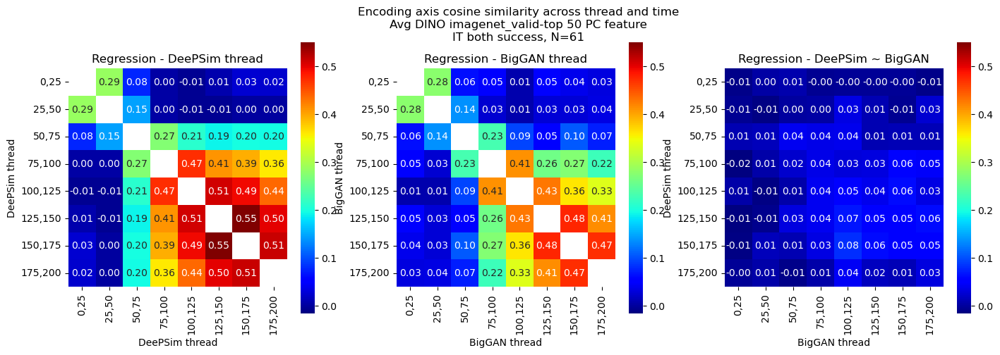

In [ ]:
msk = (validmsk & bothsucs_msk & ITmsk).to_numpy()
msk_str = f"IT both success, N={msk.sum()}"
PCcutoff = 50
slc = slice(-8, None)
PCi = [2, 5, 10, 20, 50, 100, 200, 500, 768].index(PCcutoff)
data = [stats_col_tsr["cossim00"][msk, PCi].mean(axis=0)[slc,slc], 
        stats_col_tsr["cossim11"][msk, PCi].mean(axis=0)[slc,slc], 
        stats_col_tsr["cossim01"][msk, PCi].mean(axis=0)[slc,slc]]
label_xys = [("DeePSim thread", "DeePSim thread"), 
            ("BigGAN thread", "BigGAN thread"),
            ("BigGAN thread", "DeePSim thread")]
title = ["Regression - DeePSim thread", "Regression - BigGAN thread", "Regression - DeePSim ~ BigGAN"]
figh, axs = plot_heatmap(data, timewdw_strs[slc], timewdw_strs[slc], label_xys, title)
figh.suptitle(f"Encoding axis cosine similarity across thread and time\nAvg {'DINO'} {dataset_str}-top {PCcutoff} PC feature\n{msk_str}")
figh.show()

In [ ]:
ttest_1samp(stats_col_tsr["cossim01"][msk, PCi][:, slc,slc], popmean=0.0, axis=0, )

TtestResult(statistic=array([[-0.544,  0.226,  0.393, -0.231, -0.161, -0.133, -0.153, -0.561],
       [-0.312, -0.672,  0.025,  0.22 ,  1.868,  0.613, -0.331,  1.391],
       [ 0.497,  0.763,  2.153,  2.068,  1.969,  0.491,  0.613,  0.605],
       [-0.755,  0.347,  1.158,  1.937,  1.75 ,  1.856,  3.022,  2.582],
       [ 0.314, -0.707,  0.316,  1.937,  2.765,  1.938,  3.507,  2.002],
       [-0.751, -0.443,  1.598,  2.048,  4.085,  3.219,  2.717,  3.967],
       [-0.65 ,  0.894,  0.503,  1.814,  4.589,  3.218,  2.841,  2.711],
       [-0.185,  0.345, -0.544,  0.316,  2.249,  0.932,  0.752,  2.261]]), pvalue=array([[0.588, 0.822, 0.695, 0.818, 0.872, 0.895, 0.879, 0.577],
       [0.756, 0.504, 0.98 , 0.827, 0.067, 0.543, 0.742, 0.169],
       [0.621, 0.449, 0.035, 0.043, 0.054, 0.625, 0.542, 0.548],
       [0.453, 0.729, 0.251, 0.057, 0.085, 0.068, 0.004, 0.012],
       [0.755, 0.483, 0.753, 0.057, 0.008, 0.057, 0.001, 0.05 ],
       [0.456, 0.66 , 0.115, 0.045, 0.   , 0.002, 0.009, 0. 

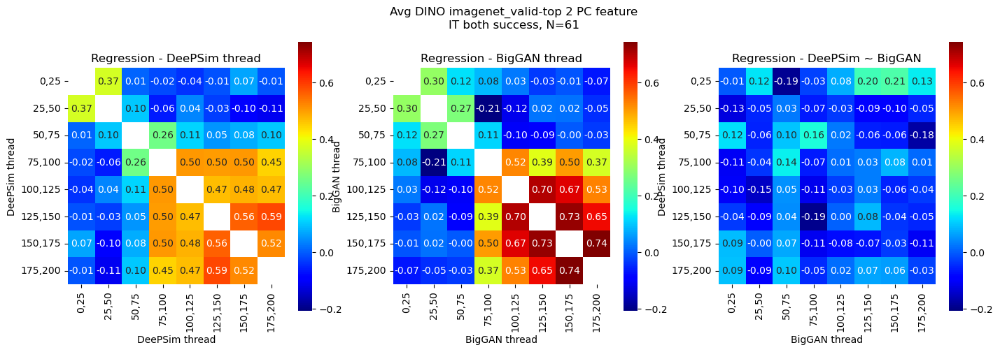

In [ ]:
msk = (validmsk & bothsucs_msk & ITmsk).to_numpy()
msk_str = f"IT both success, N={msk.sum()}"
PCcutoff = 2
slc = slice(-8, None)
PCi = [2, 5, 10, 20, 50, 100, 200, 500, 768].index(PCcutoff)
data = [stats_col_tsr["cossim00"][msk, PCi].mean(axis=0)[slc,slc], 
        stats_col_tsr["cossim11"][msk, PCi].mean(axis=0)[slc,slc], 
        stats_col_tsr["cossim01"][msk, PCi].mean(axis=0)[slc,slc]]
label_xys = [("DeePSim thread", "DeePSim thread"), 
            ("BigGAN thread", "BigGAN thread"),
            ("BigGAN thread", "DeePSim thread")]
title = ["Regression - DeePSim thread", "Regression - BigGAN thread", "Regression - DeePSim ~ BigGAN"]
figh, axs = plot_heatmap(data, timewdw_strs[slc], timewdw_strs[slc], label_xys, title)
figh.suptitle(f"Avg {'DINO'} {dataset_str}-top {PCcutoff} PC feature\n{msk_str}")
figh.show()

In [ ]:
stats_col_tsr["cross_eval_eachtime_tsr"].shape

(170, 9, 3, 3, 13)

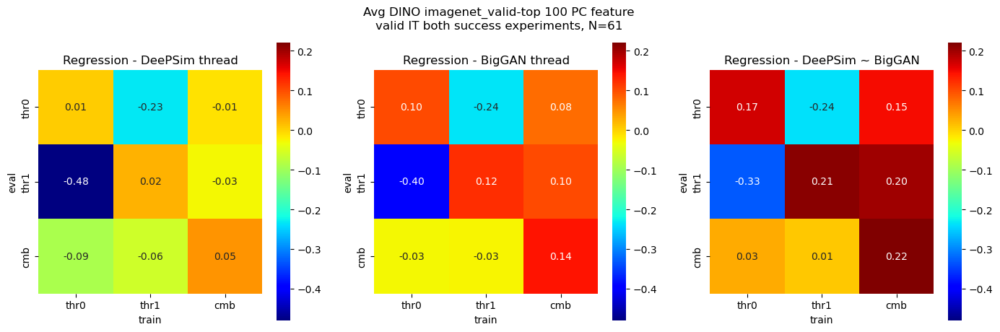

In [ ]:
msk = validmsk & bothsucs_msk & ITmsk
msk_str = f"valid IT both success experiments, N={msk.sum()}"
PCcutoff = 100
slc = slice(-8, None)
PCi = [2, 5, 10, 20, 50, 100, 200, 500, 768].index(PCcutoff)
data = [stats_col_tsr["cross_eval_mat"][msk, 0].mean(axis=0),
        stats_col_tsr["cross_eval_mat"][msk, PCi].mean(axis=0),
        stats_col_tsr["cross_eval_mat"][msk, -1].mean(axis=0),]
tick_labels = ["thr0", "thr1", "cmb"]
label_xys = [("train", "eval",), 
            ( "train", "eval",), 
            ("train",  "eval",) ] # double check which is which
title = ["Regression - DeePSim thread", "Regression - BigGAN thread", "Regression - DeePSim ~ BigGAN"]
figh, axs = plot_heatmap(data, tick_labels, tick_labels, label_xys, title)
figh.suptitle(f"Avg {'DINO'} {dataset_str}-top {PCcutoff} PC feature\n{msk_str}")
figh.show()

### Encoding Axes Stability - Single PC Space
depending on num of PC in regression

In [15]:
Expi = 155
savedir = r"/n/holylabs/LABS/kempner_fellows/Users/binxuwang/Projects/BigGAN_Project/EvolLinReg_axes"

model_stats_synopsis = pkl.load(open(join(savedir, f"Exp{Expi:03d}_imagenet_valid_PC_model_stats.pkl"), "rb"))
cross_eval_synopsis = pkl.load(open(join(savedir, f"Exp{Expi:03d}_imagenet_valid_PC_cross_eval_stats.pkl"), "rb"))

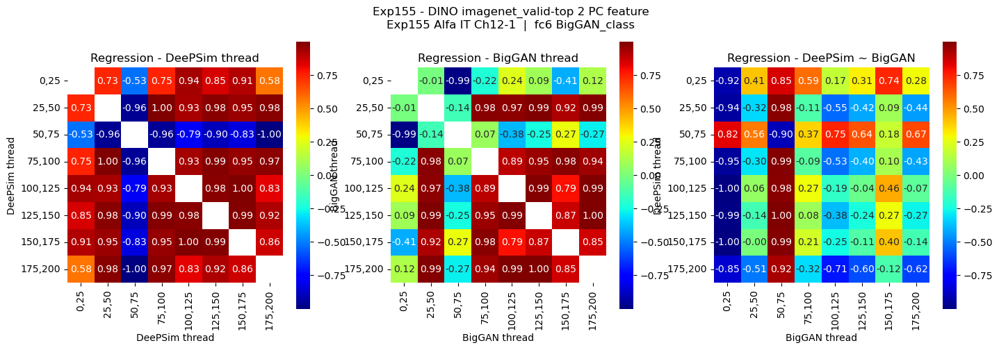

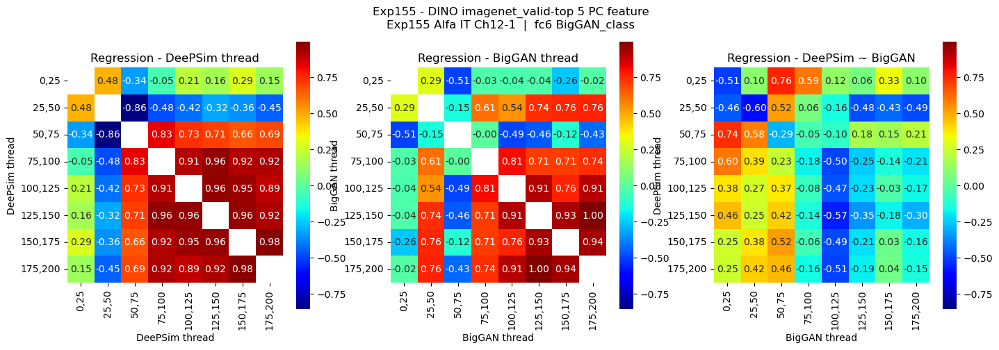

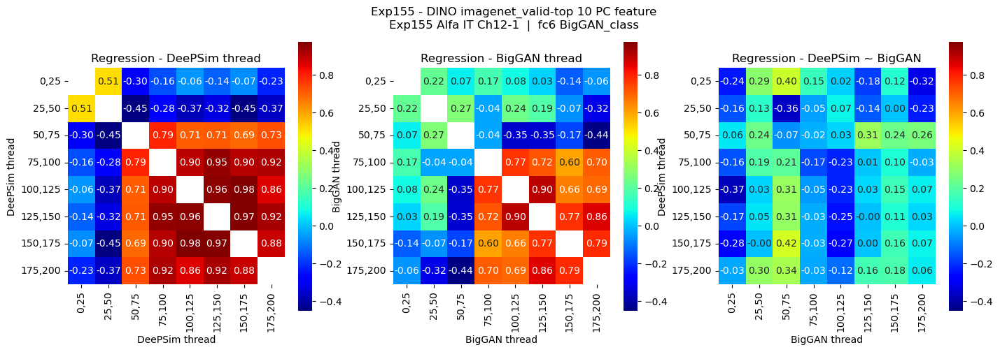

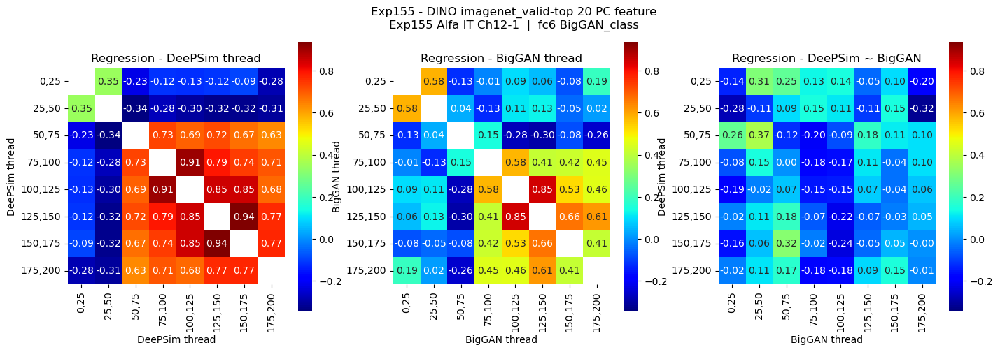

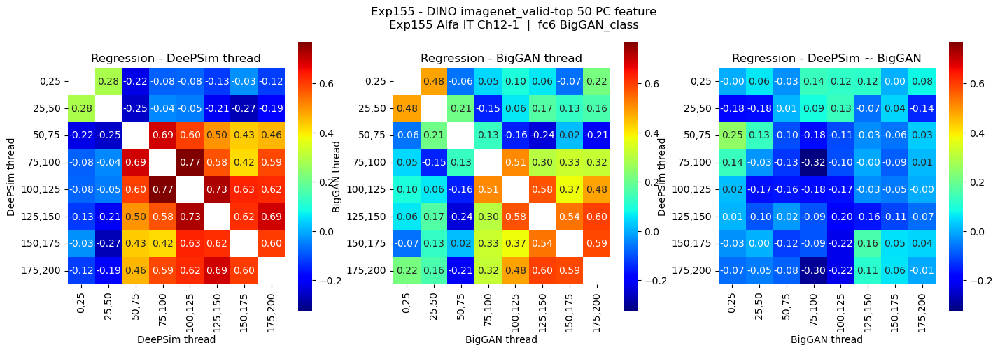

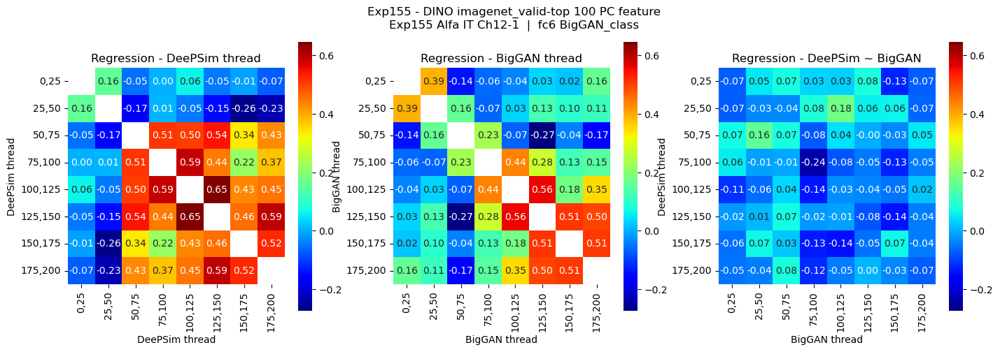

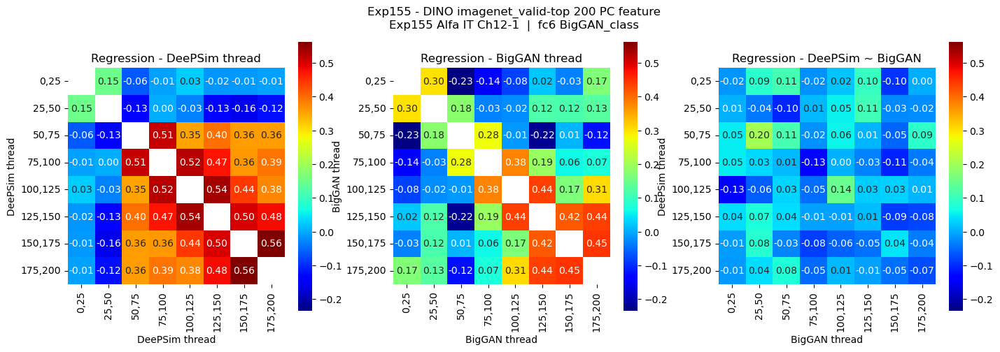

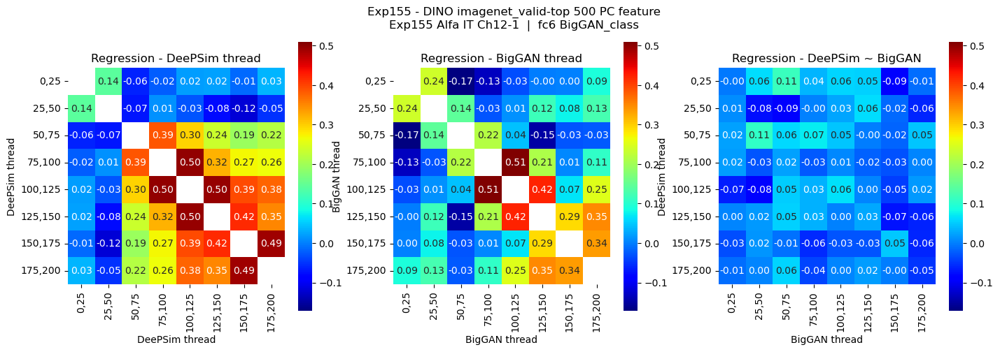

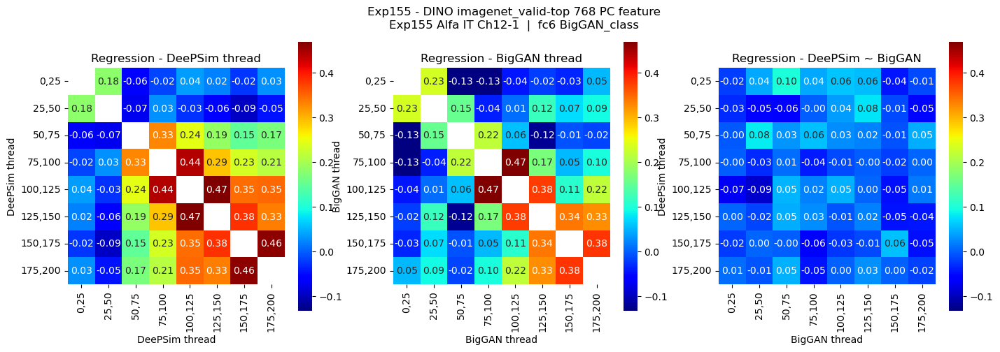

In [ ]:
Expi = 155
savedir = r"/n/holylabs/LABS/kempner_fellows/Users/binxuwang/Projects/BigGAN_Project/EvolLinReg_axes"

model_stats_synopsis = pkl.load(open(join(savedir, f"Exp{Expi:03d}_imagenet_valid_PC_model_stats.pkl"), "rb"))
cross_eval_synopsis = pkl.load(open(join(savedir, f"Exp{Expi:03d}_imagenet_valid_PC_cross_eval_stats.pkl"), "rb"))

metaS = meta_df.loc[Expi]
expstr = f"Exp{Expi:03d} {metaS['Animal']} {metaS['visual_area']} Ch{metaS['prefchan']}-{metaS['prefunit']}"\
            f"  |  {metaS['space_names1']} {metaS['space_names2']}" 

for PCcutoff in model_stats_synopsis:
    model0 = model_stats_synopsis[PCcutoff]["thread 0"][0]
    model1 = model_stats_synopsis[PCcutoff]["thread 1"][0]
    cossim00 = cosine_similarity(model0.coef_, model0.coef_)
    cossim11 = cosine_similarity(model1.coef_, model1.coef_)
    cossim01 = cosine_similarity(model0.coef_, model1.coef_)
    # set diagonal to nan
    cossim00 = cossim00 + np.diag(np.ones(cossim00.shape[0])*np.nan)
    cossim11 = cossim11 + np.diag(np.ones(cossim11.shape[0])*np.nan) 
    for slc in [slice(-8, None)]: #slice(1, 5), 
        data = [cossim00[slc, slc], cossim11[slc, slc], cossim01[slc, slc]]
        xticklabels = [f"{wdw[0]},{wdw[-1]+1}" for wdw in rsp_wdw_fine[slc]]
        yticklabels = [f"{wdw[0]},{wdw[-1]+1}" for wdw in rsp_wdw_fine[slc]]
        label_xys = [("DeePSim thread", "DeePSim thread"), 
                    ("BigGAN thread", "BigGAN thread"),
                    ("BigGAN thread", "DeePSim thread")]
        title = ["Regression - DeePSim thread", "Regression - BigGAN thread", "Regression - DeePSim ~ BigGAN"]
        figh, axs = plot_heatmap(data, xticklabels, yticklabels, label_xys, title)
        figh.suptitle(f"Exp{Expi:03d} - {'DINO'} {dataset_str}-top {PCcutoff} PC feature\n{expstr}")
        figh.show()